In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import statsmodels.api as sm

In [105]:
def importdata(url):
    df = pd.read_csv(url)
    
    
    for col in df:
        if col[0].isdigit():
            nums = ["zero", "un", "deux", "trois", "quatre", "cinq", "six", "sept", "huit", "neuf"]
            new_col_name = nums[int(col[0])] + "_" + col
            df.rename(columns={col: new_col_name}, inplace=True)
    
    pd.set_option('display.max_rows', 100)
    pd.set_option('display.max_columns', 100)
    return df

df = importdata('C:\\Users\\poste\\stage\\data.csv')
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,un_1stFlrSF,deux_2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,trois_3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


CLEANING PHASE

In [72]:
df.shape

(1314, 80)

In [73]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1314 entries, 0 to 1313
Data columns (total 80 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   MSSubClass       1314 non-null   int64  
 1   MSZoning         1314 non-null   object 
 2   LotFrontage      1084 non-null   float64
 3   LotArea          1314 non-null   int64  
 4   Street           1314 non-null   object 
 5   Alley            83 non-null     object 
 6   LotShape         1314 non-null   object 
 7   LandContour      1314 non-null   object 
 8   Utilities        1314 non-null   object 
 9   LotConfig        1314 non-null   object 
 10  LandSlope        1314 non-null   object 
 11  Neighborhood     1314 non-null   object 
 12  Condition1       1314 non-null   object 
 13  Condition2       1314 non-null   object 
 14  BldgType         1314 non-null   object 
 15  HouseStyle       1314 non-null   object 
 16  OverallQual      1314 non-null   int64  
 17  OverallCond   

In [74]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns',None)

<Axes: >

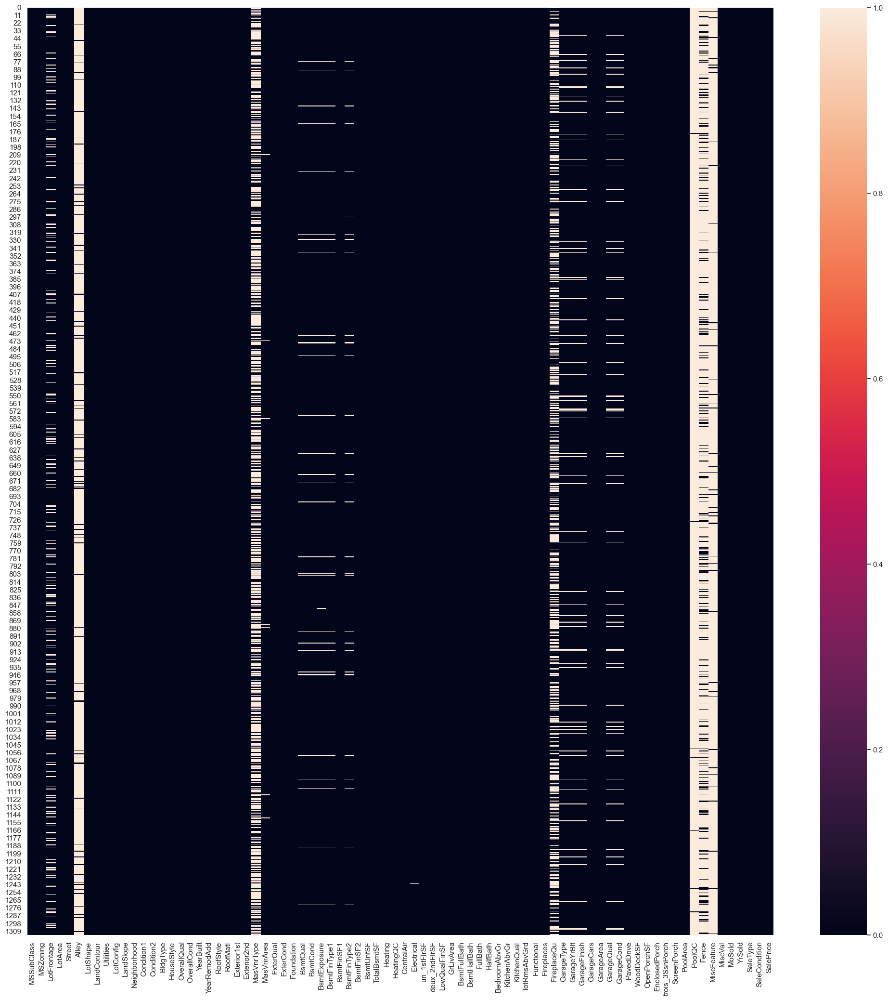

In [75]:
plt.figure(figsize=(25,25))
sns.heatmap(df.isnull())

In [76]:
# finding percentage of missing data for each column
null_var=df.isnull().sum()/df.shape[0]*100
null_var

MSSubClass          0.000000
MSZoning            0.000000
LotFrontage        17.503805
LotArea             0.000000
Street              0.000000
Alley              93.683409
LotShape            0.000000
LandContour         0.000000
Utilities           0.000000
LotConfig           0.000000
LandSlope           0.000000
Neighborhood        0.000000
Condition1          0.000000
Condition2          0.000000
BldgType            0.000000
HouseStyle          0.000000
OverallQual         0.000000
OverallCond         0.000000
YearBuilt           0.000000
YearRemodAdd        0.000000
RoofStyle           0.000000
RoofMatl            0.000000
Exterior1st         0.000000
Exterior2nd         0.000000
MasVnrType         59.284627
MasVnrArea          0.532725
ExterQual           0.000000
ExterCond           0.000000
Foundation          0.000000
BsmtQual            2.359209
BsmtCond            2.359209
BsmtExposure        2.435312
BsmtFinType1        2.359209
BsmtFinSF1          0.000000
BsmtFinType2  

In [77]:
# finding columns in which missing column values have more than 20% data missing
drop_columns=null_var[null_var>17].keys()
drop_columns

Index(['LotFrontage', 'Alley', 'MasVnrType', 'FireplaceQu', 'PoolQC', 'Fence',
       'MiscFeature'],
      dtype='object')

In [78]:
df=df.drop(columns=drop_columns)  # droping columns

In [79]:
df

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,un_1stFlrSF,deux_2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,trois_3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,20,RL,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,60,RL,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,70,RL,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,60,RL,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
5,50,RL,14115,Pave,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000
6,20,RL,10084,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,307000
7,50,RM,6120,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,129900
8,190,RL,7420,Pave,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,TA,5,Typ,2,Attchd,1939.0,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,0,1,2008,WD,Normal,118000
9,60,RL,11924,Pave,IR1,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,2Story,9,5,2005,2006,Hip,CompShg,WdShing,Wd Shng,286.0,Ex,TA,PConc,Ex,TA,No,GLQ,998,Unf,0,177,1175,GasA,Ex,Y,SBrkr,1182,1142,0,2324,1,0,3,0,4,1,Ex,11,Typ,2,BuiltIn,2005.0,Fin,3,736,TA,TA,Y,147,21,0,0,0,0,0,7,2006,New,Partial,345000


In [80]:
df.shape

(1314, 73)

<Axes: >

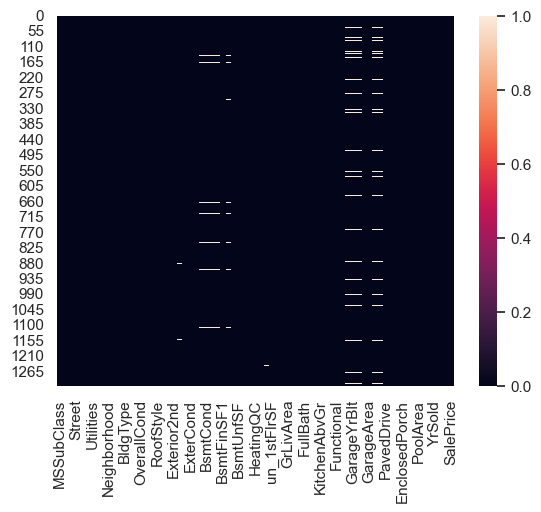

In [81]:
sns.heatmap(df.isnull())

In [82]:
df=df.dropna()  # deleting rows having null values

In [83]:
df.shape

(1206, 73)

<Axes: >

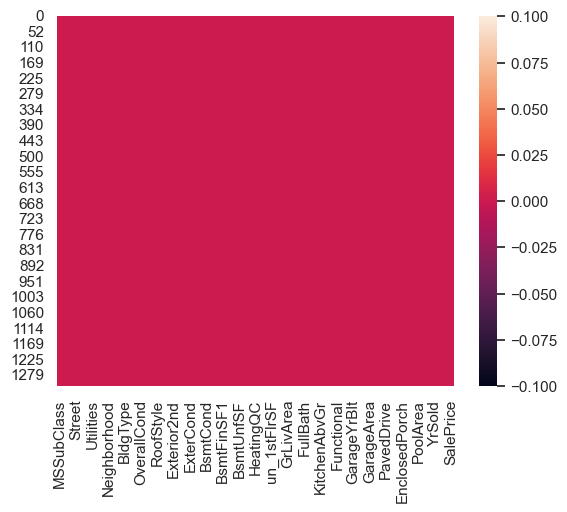

In [84]:
sns.heatmap(df.isnull())

In [85]:

 #univariable stats
import pandas as pd
output_df=pd.DataFrame(columns=["count","missing","unique","dtype","numeric","mode","mean","min","25%","median","75%","max","std","skew","kurt"])
for col in df:
    if pd.api.types.is_numeric_dtype(df[col]):
        
        output_df.loc[col]=[df[col].count(),df[col].isnull().sum(),df[col].nunique(),df[col].dtype,pd.api.types.is_numeric_dtype(df[col]),df[col].mode().values[0],df[col].mean(),df[col].min(),df[col].quantile(0.25),df[col].quantile(0.5),df[col].quantile(0.75),df[col].max(),df[col].std(),df[col].skew(),df[col].kurt()]
    else:
        output_df.loc[col]=[df[col].count(),df[col].isnull().sum(),df[col].nunique(),df[col].dtype,pd.api.types.is_numeric_dtype(df[col]),df[col].mode().values[0],"-","-","-","-","-","-","-","-","-"]

pd.set_option("display.max_rows",100)
pd.set_option("display.max_columns",100)
output_df.sort_values(by=["numeric","skew","unique"],ascending=False)

,count,missing,unique,dtype,numeric,mode,mean,min,25%,median,75%,max,std,skew,kurt
MiscVal,1206,0,19,int64,True,0,46.429519,0,0.0,0.0,0.0,15500,534.457449,23.459704,628.46712
PoolArea,1206,0,8,int64,True,0,3.339967,0,0.0,0.0,0.0,738,44.18746,13.460498,183.697589
LotArea,1206,0,911,int64,True,9600,10618.351575,1300,7758.0,9600.0,11742.5,215245,9762.155655,12.425499,217.47507
LowQualFinSF,1206,0,13,int64,True,0,3.658375,0,0.0,0.0,0.0,572,37.860031,11.30983,132.654207
trois_3SsnPorch,1206,0,20,int64,True,0,3.978441,0,0.0,0.0,0.0,508,31.812514,9.572061,106.230035
KitchenAbvGr,1206,0,3,int64,True,1,1.031509,1,1.0,1.0,1.0,3,0.179447,5.796508,34.545308
BsmtFinSF2,1206,0,129,int64,True,0,49.492537,0,0.0,0.0,0.0,1474,167.501472,4.157449,19.104608
ScreenPorch,1206,0,74,int64,True,0,17.344113,0,0.0,0.0,0.0,480,59.659519,3.812531,15.647067
BsmtHalfBath,1206,0,3,int64,True,0,0.063847,0,0.0,0.0,0.0,2,0.247952,3.735036,12.807547
EnclosedPorch,1206,0,100,int64,True,0,21.035655,0,0.0,0.0,0.0,552,60.812708,3.268956,11.932633


bivariate stats :
numeric to numeric
categorical to numeric

In [86]:
def anova(df, feature, label):
    import numpy as np
    from scipy import stats

    groups = df[feature].unique()
    df_grouped = df.groupby(feature)
    group_labels = []
    
    for g in groups:
        g_list = df_grouped.get_group(g)
        group_labels.append(g_list[label])
    
    return stats.f_oneway(*group_labels)




In [87]:
def heteroscedasticity(df,feature,label):
    from statsmodels.stats.diagnostic import het_breuschpagan
    from statsmodels.stats.diagnostic import het_white
    import statsmodels.api as sm
    from statsmodels.formula.api import ols
    
    #ols model
    model=ols(formula=(feature + '~' + label),data=df).fit()
    bp_test=het_breuschpagan(model.resid, model.model.exog)
    white_test=het_white(model.resid, model.model.exog)
    output_df=pd.DataFrame(columns=['LM stats','LM p-value','F stats','F p-value'])
    output_df.loc['white']=white_test
    output_df.loc['bp']=bp_test
    
    return output_df.round(3)

  

In [88]:
heteroscedasticity(df,'OverallQual','SalePrice')


,LM stats,LM p-value,F stats,F p-value
white,182.780,0.0,107.447,0.0
bp,33.694,0.0,34.605,0.0


In [89]:
def scatter(feature,label):
    import seaborn as sns
    from scipy import stats
    import matplotlib.pyplot as plt

    m,b,r,p,err=stats.linregress(feature,label)
    textstr='y =' + str(round(m,2)) +'x +'+str(round(b,2)) + '\n'
    textstr+='r-carre =' + str(round(r**2,2)) + '\n'
    textstr+=str(feature.name) +'skew =' + str(round(feature.skew(),2)) +'\n'
    textstr+=str(label.name) +'skew =' + str(round(label.skew(),2)) +'\n'
    textstr+=str(heteroscedasticity(pd.DataFrame(label).join(pd.DataFrame(feature)),feature.name,label.name))

    sns.set(color_codes=True)
    #ax=sns.jointplot(feature,label,kind='reg')
    ax = sns.jointplot(data=pd.DataFrame({'x': feature, 'y': label}), x='x', y='y', kind='reg')
    ax.fig.text(1,0.114, textstr, fontsize=12, transform=plt.gcf().transFigure)
    plt.show()

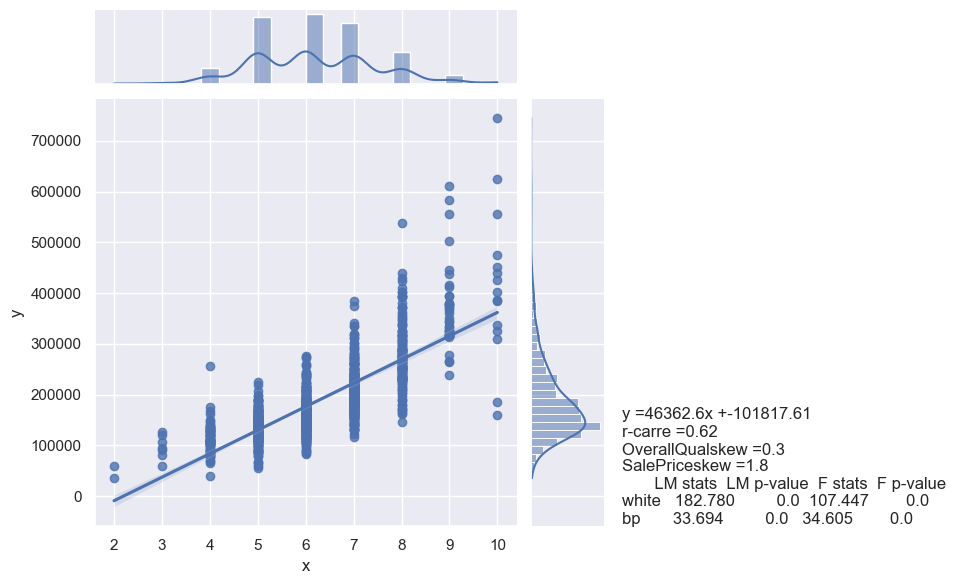

In [90]:
scatter(df.OverallQual, df.SalePrice)

In [91]:
def barchar(df,feature,label):
    import pandas as pd
    from scipy import stats
    from matplotlib import pyplot as plt 
    import seaborn as sns
    #calculer les F et p_value
    oneway=anova(df,feature,label)
    #calculer t-tests avec bonnferonni corection pour p-value
    unique_groups=df[feature].unique()
    ttests=[]
    for i,g in enumerate(unique_groups):
        for i1,g1 in enumerate(unique_groups):
            if i1>i:
                type=df[df[feature]==g]
                type1=df[df[feature]==g1]
                if len(type[label])<2 or len(type1[label])<2:
                    print("r"+g+" n="+str(len(type[label]))+",'"+g1+"' n="+str(len(type1[label])) +"ttest n'est pas possible")
                else:
                    t ,p=stats.ttest_ind(type[label],type1[label])
                    ttests.append([g,g1,t.round(4),p.round(4)])
                    
    if len(ttests)>0:
        p_threshold=0.05/len(ttests)
    else:
        p_threshold=0.05
    #tetx descreptoin
    textstr='       ANOVA'+'\n'
    textstr+='F :       ' +str(oneway[0].round(2))+'\n'
    textstr+='p-value:      '+str(oneway[1].round(2))+'\n'
    textstr+='sig  comparision (bonferroni-corection) : '+'\n'
    for ttest in ttests:
        if ttest[3]<=p_threshold:
            textstr+=str(ttest[0])+ '~' +str(ttest[1])+',t='+str(ttest[2])+',p='+str(ttest[3])+'\n'
    ax=sns.barplot(data=df, x=feature, y=label)
    ax.text(1,0.114, textstr, fontsize=12, transform=plt.gcf().transFigure)
    plt.show()
    

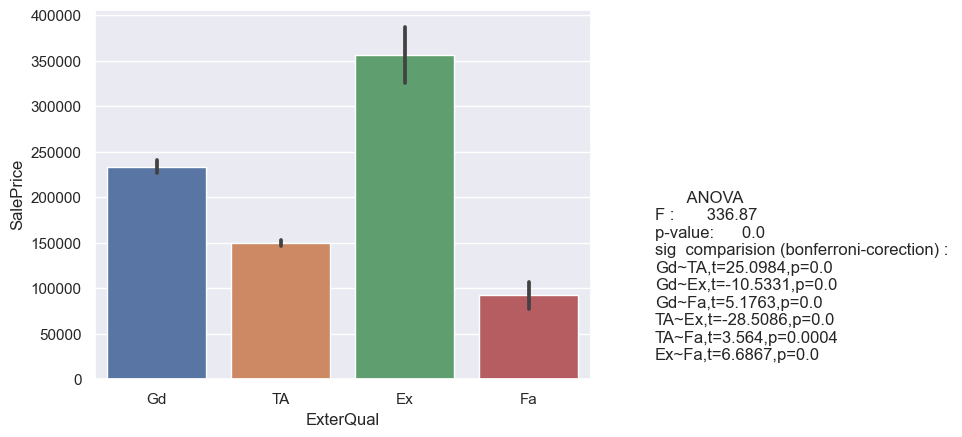

In [92]:
barchar(df,'ExterQual', 'SalePrice')

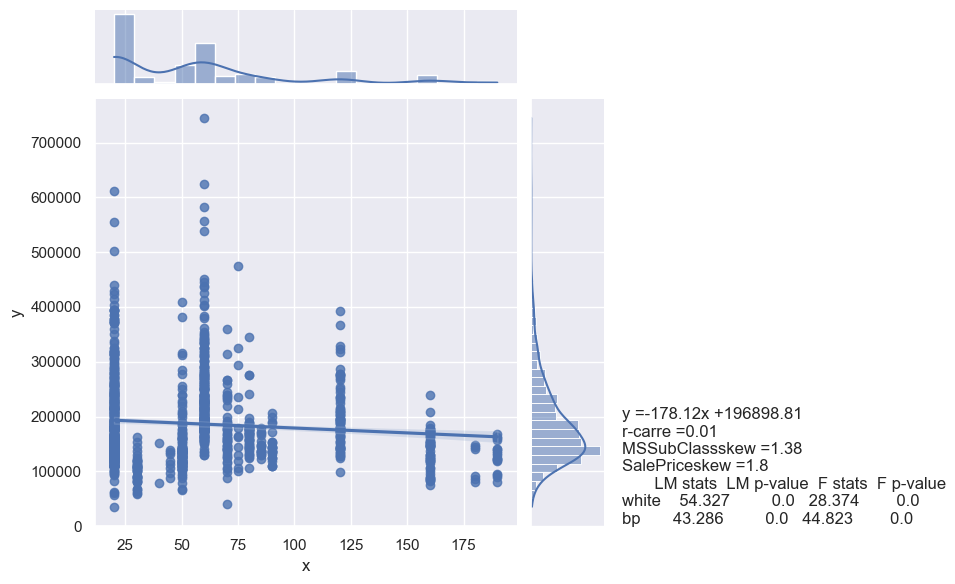

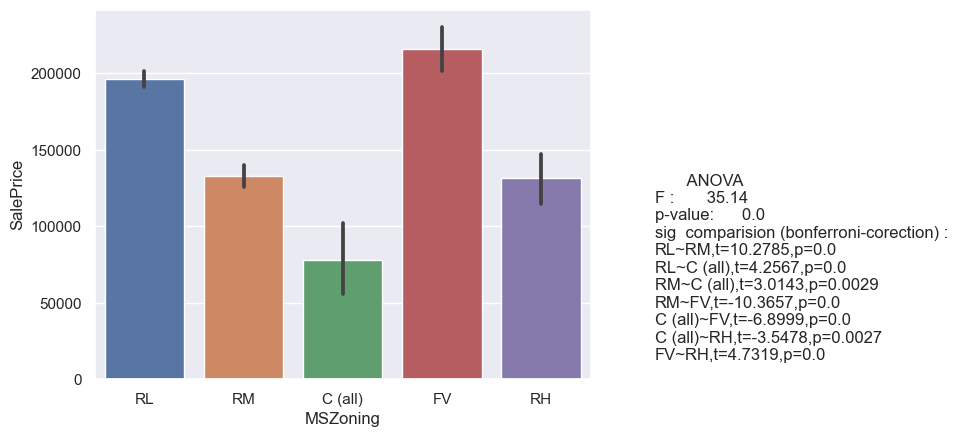

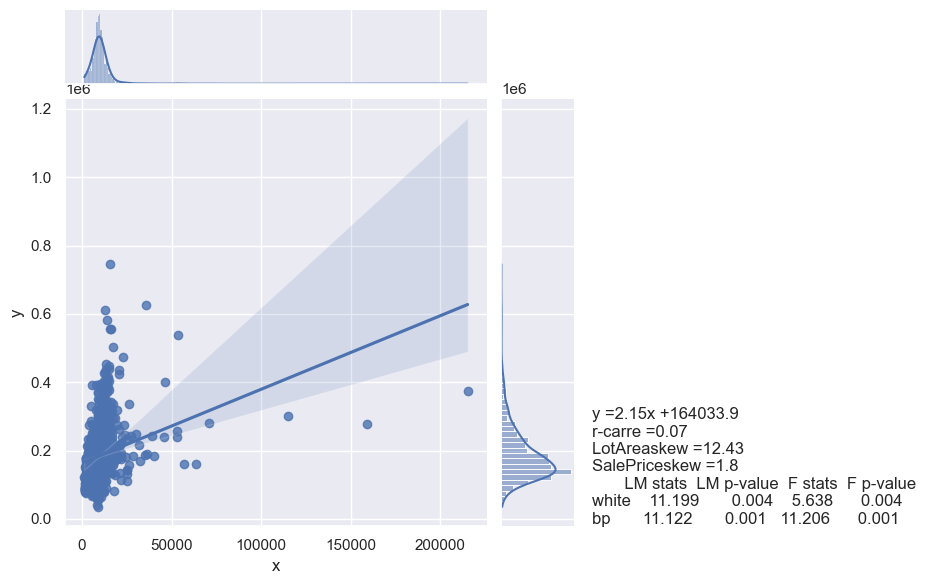

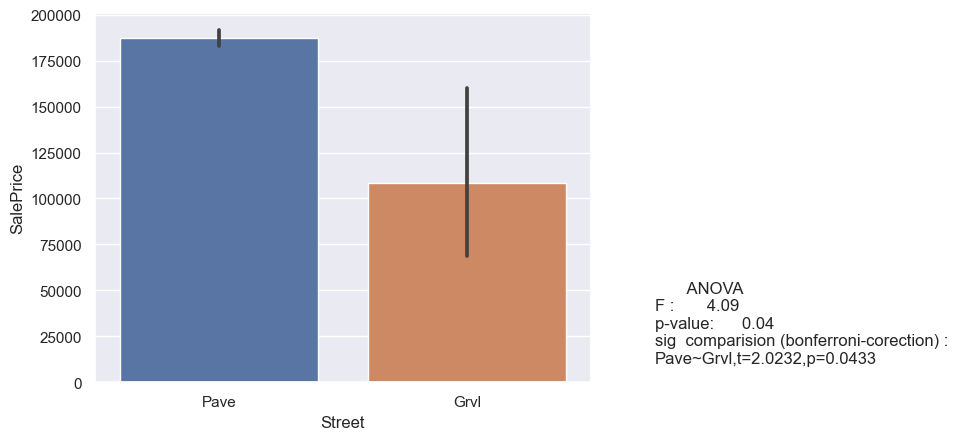

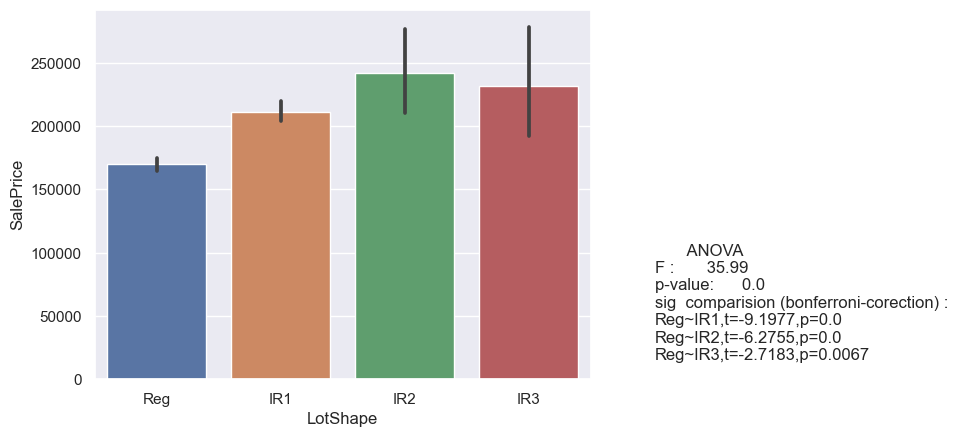

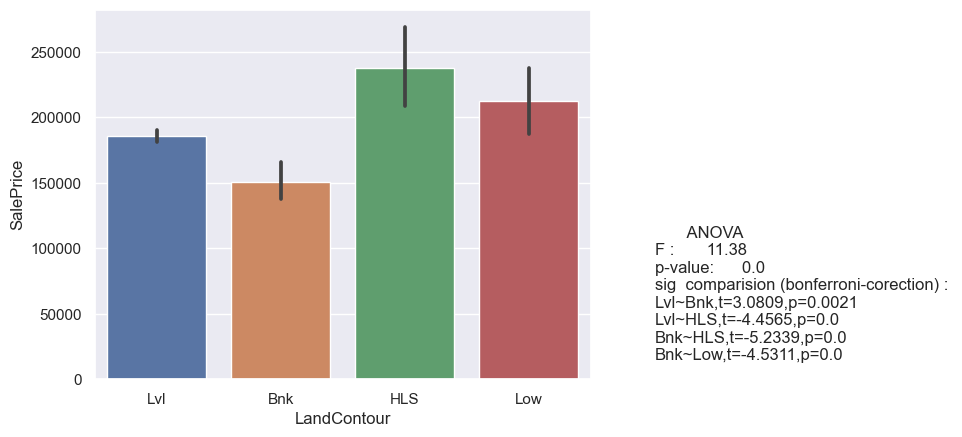

rAllPub n=1205,'NoSeWa' n=1ttest n'est pas possible


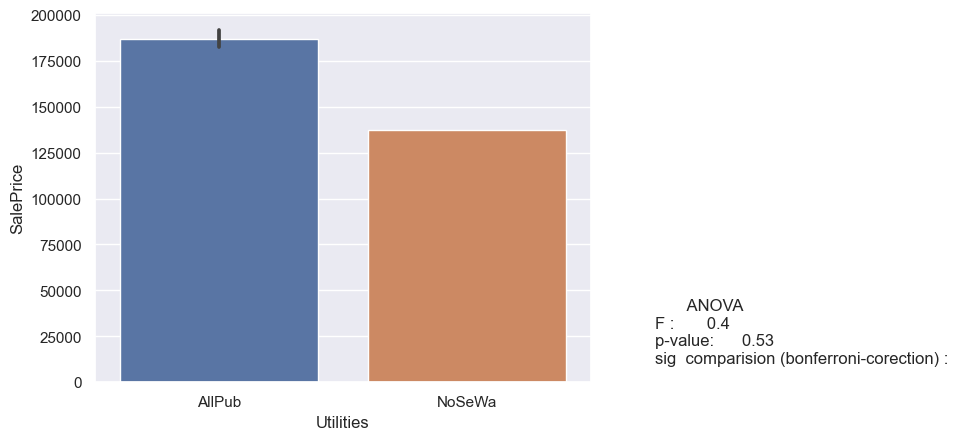

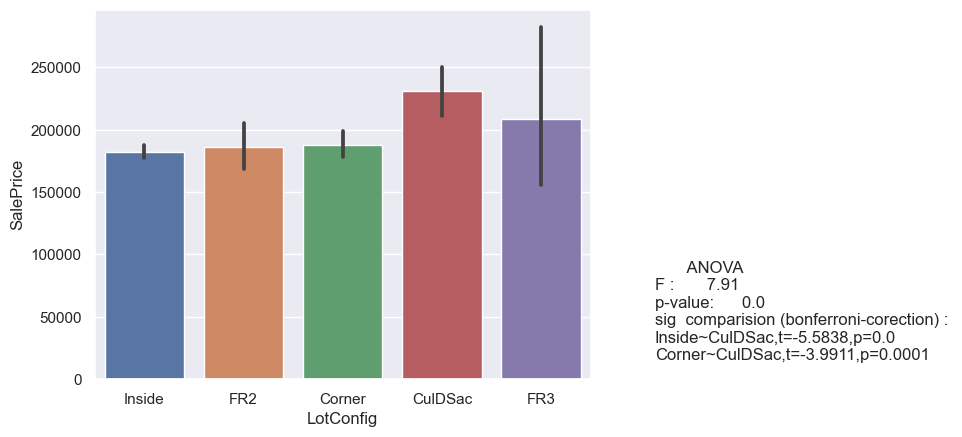

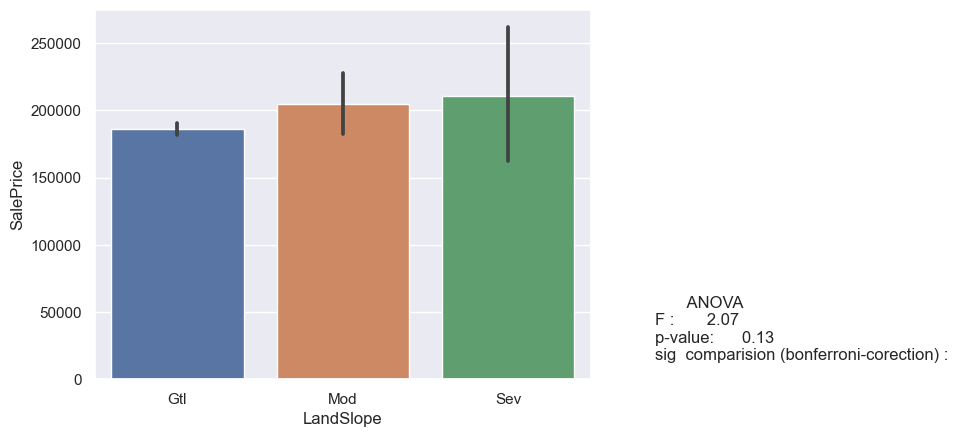

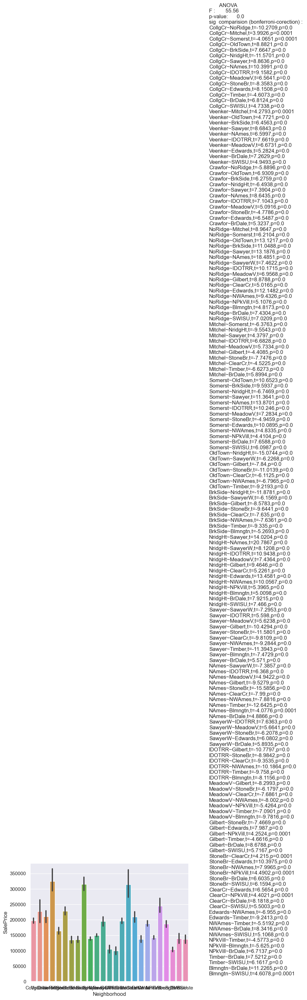

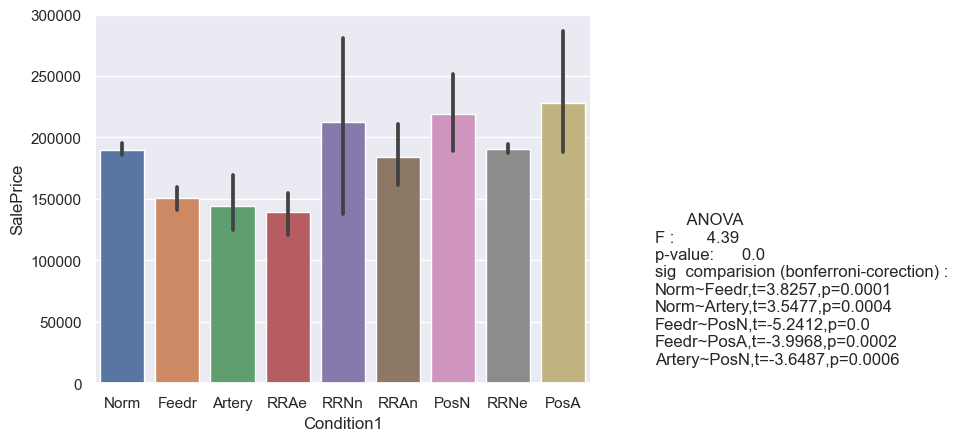

rNorm n=1192,'PosA' n=1ttest n'est pas possible
rNorm n=1192,'RRAn' n=1ttest n'est pas possible
rNorm n=1192,'RRAe' n=1ttest n'est pas possible
rArtery n=2,'PosA' n=1ttest n'est pas possible
rArtery n=2,'RRAn' n=1ttest n'est pas possible
rArtery n=2,'RRAe' n=1ttest n'est pas possible
rRRNn n=2,'PosA' n=1ttest n'est pas possible
rRRNn n=2,'RRAn' n=1ttest n'est pas possible
rRRNn n=2,'RRAe' n=1ttest n'est pas possible
rFeedr n=5,'PosA' n=1ttest n'est pas possible
rFeedr n=5,'RRAn' n=1ttest n'est pas possible
rFeedr n=5,'RRAe' n=1ttest n'est pas possible
rPosN n=2,'PosA' n=1ttest n'est pas possible
rPosN n=2,'RRAn' n=1ttest n'est pas possible
rPosN n=2,'RRAe' n=1ttest n'est pas possible
rPosA n=1,'RRAn' n=1ttest n'est pas possible
rPosA n=1,'RRAe' n=1ttest n'est pas possible
rRRAn n=1,'RRAe' n=1ttest n'est pas possible


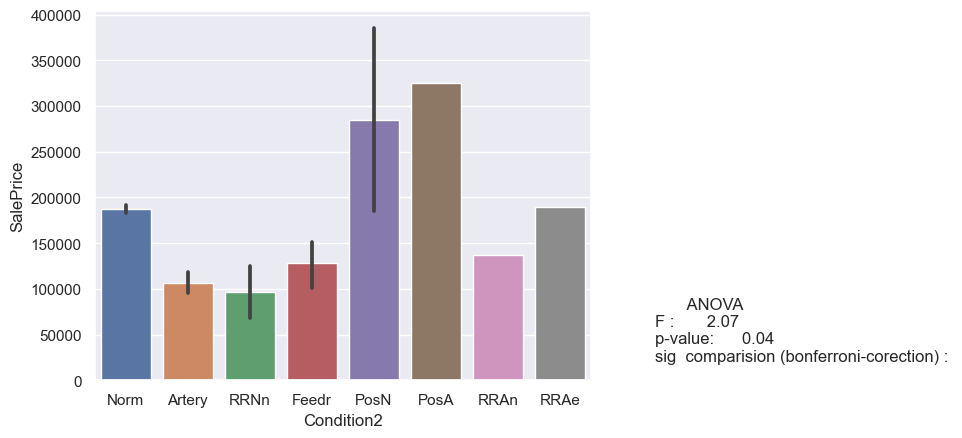

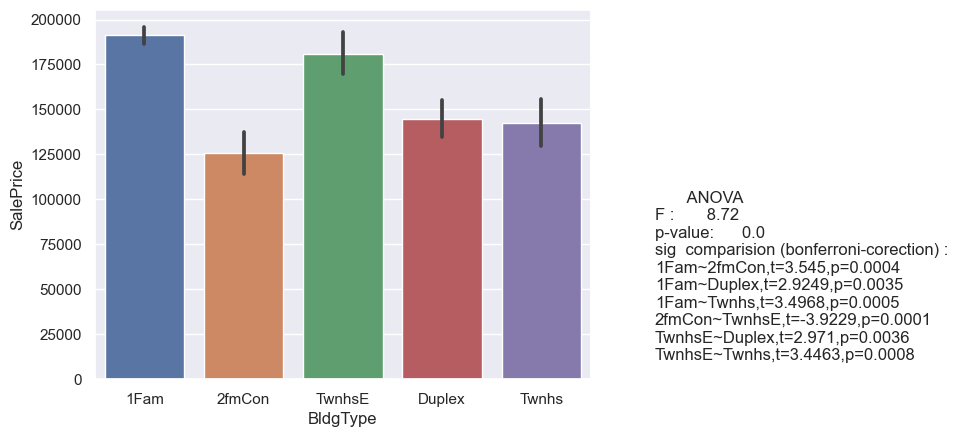

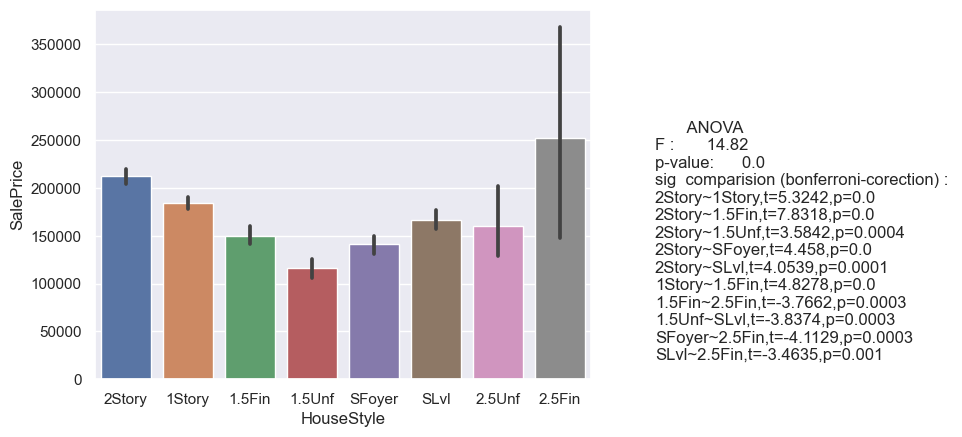

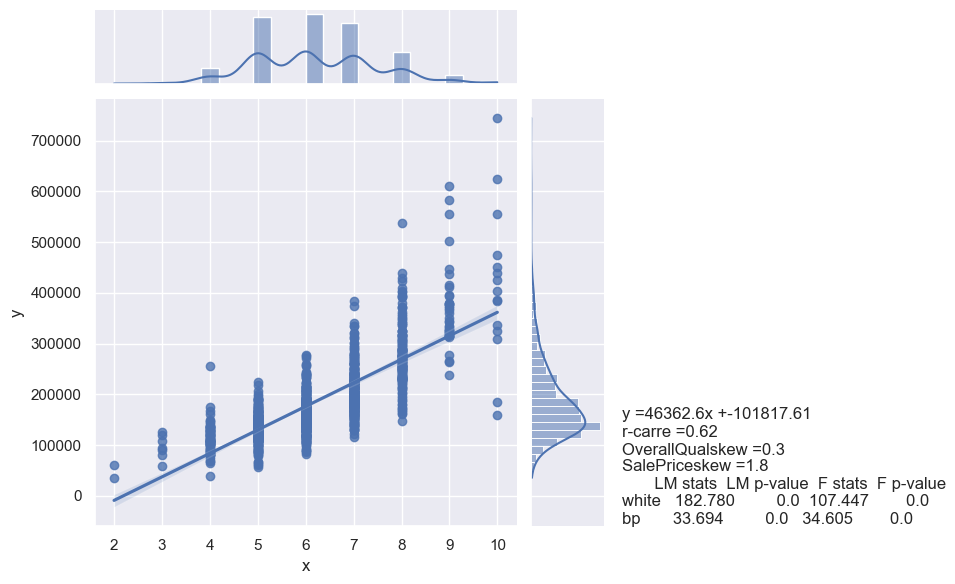

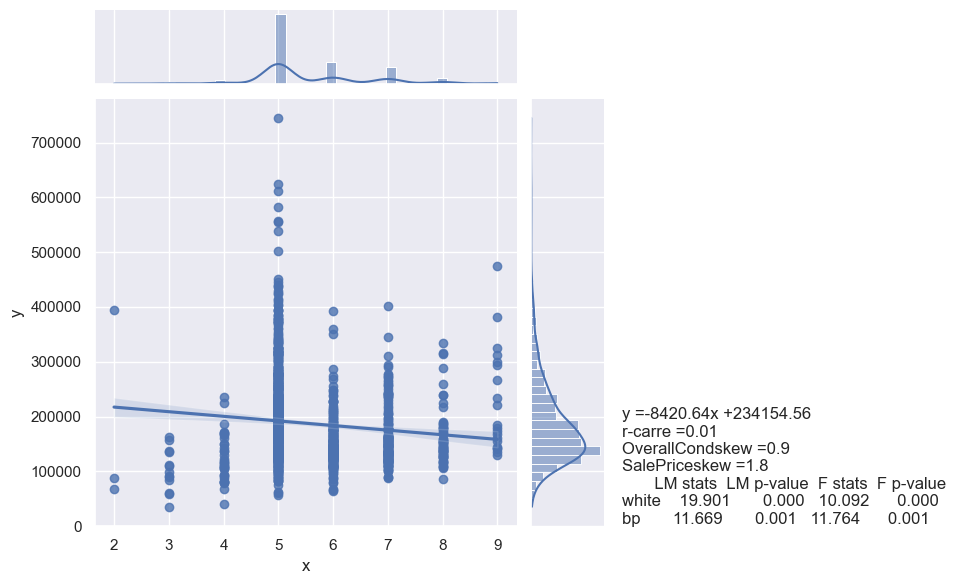

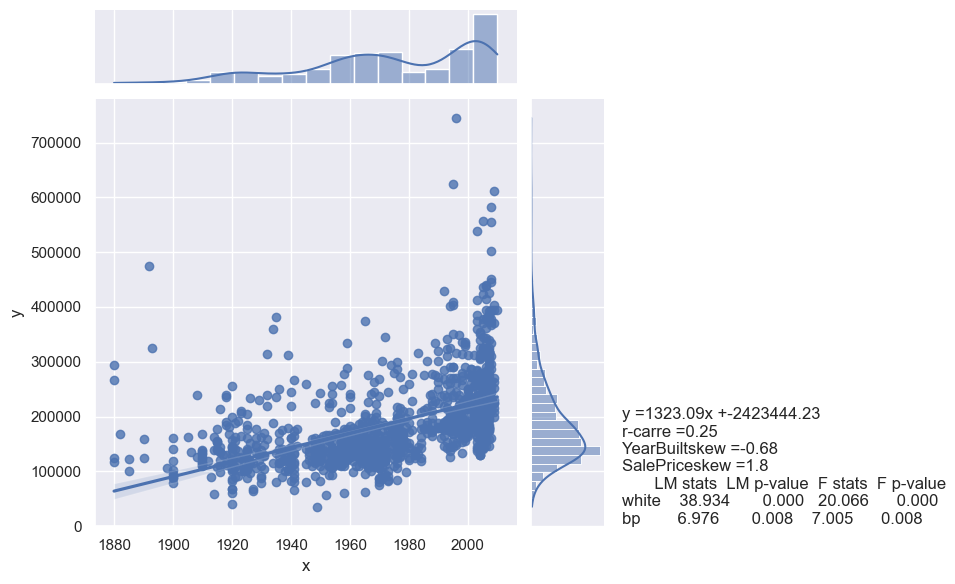

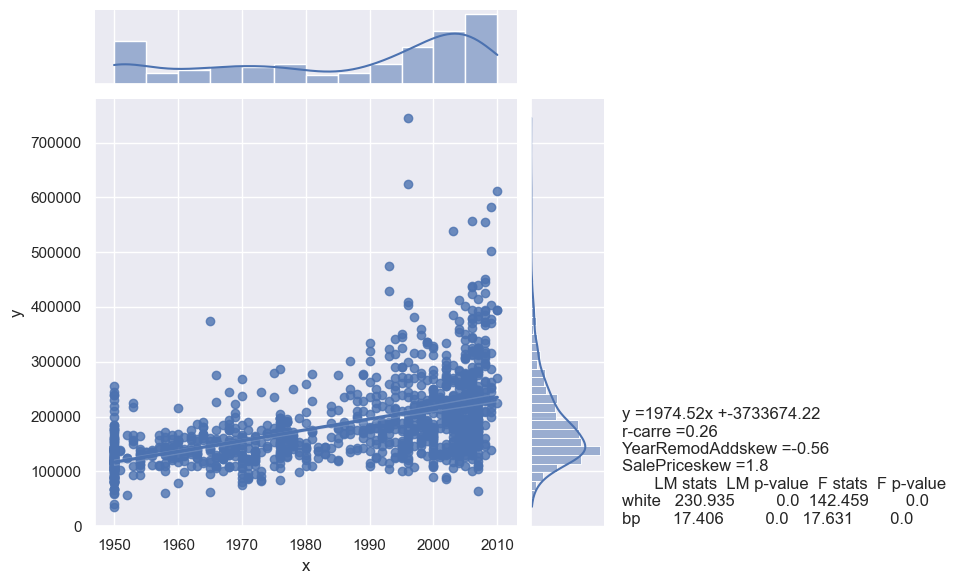

rGable n=933,'Shed' n=1ttest n'est pas possible
rHip n=245,'Shed' n=1ttest n'est pas possible
rGambrel n=10,'Shed' n=1ttest n'est pas possible
rMansard n=6,'Shed' n=1ttest n'est pas possible
rFlat n=11,'Shed' n=1ttest n'est pas possible


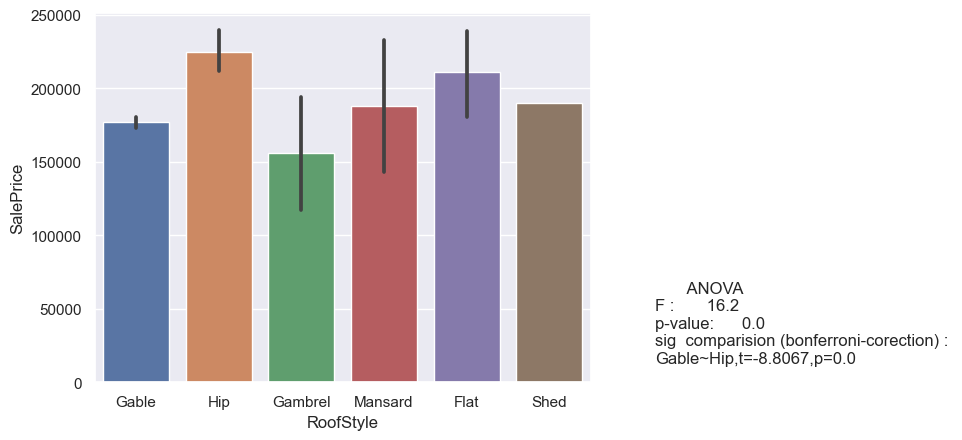

rCompShg n=1185,'Metal' n=1ttest n'est pas possible
rCompShg n=1185,'Membran' n=1ttest n'est pas possible
rCompShg n=1185,'Roll' n=1ttest n'est pas possible
rCompShg n=1185,'ClyTile' n=1ttest n'est pas possible
rMetal n=1,'WdShake' n=4ttest n'est pas possible
rMetal n=1,'WdShngl' n=4ttest n'est pas possible
rMetal n=1,'Membran' n=1ttest n'est pas possible
rMetal n=1,'Tar&Grv' n=9ttest n'est pas possible
rMetal n=1,'Roll' n=1ttest n'est pas possible
rMetal n=1,'ClyTile' n=1ttest n'est pas possible
rWdShake n=4,'Membran' n=1ttest n'est pas possible
rWdShake n=4,'Roll' n=1ttest n'est pas possible
rWdShake n=4,'ClyTile' n=1ttest n'est pas possible
rWdShngl n=4,'Membran' n=1ttest n'est pas possible
rWdShngl n=4,'Roll' n=1ttest n'est pas possible
rWdShngl n=4,'ClyTile' n=1ttest n'est pas possible
rMembran n=1,'Tar&Grv' n=9ttest n'est pas possible
rMembran n=1,'Roll' n=1ttest n'est pas possible
rMembran n=1,'ClyTile' n=1ttest n'est pas possible
rTar&Grv n=9,'Roll' n=1ttest n'est pas possible


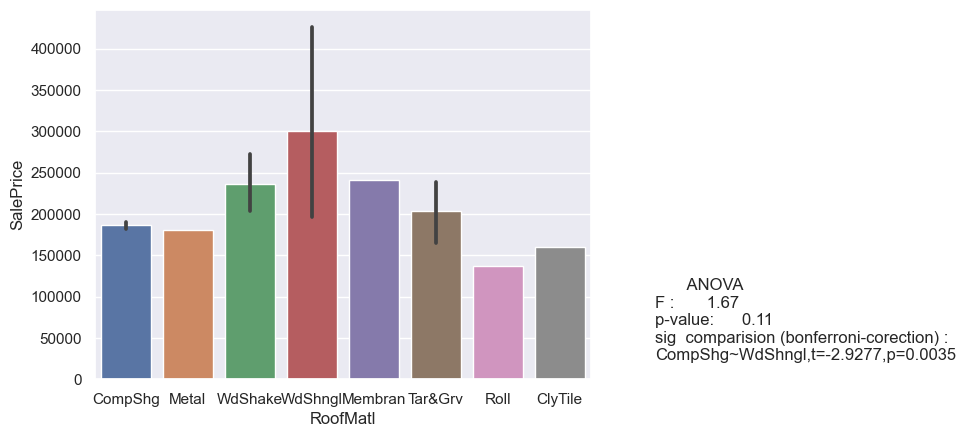

rVinylSd n=435,'BrkComm' n=1ttest n'est pas possible
rVinylSd n=435,'Stone' n=1ttest n'est pas possible
rVinylSd n=435,'ImStucc' n=1ttest n'est pas possible
rVinylSd n=435,'CBlock' n=1ttest n'est pas possible
rMetalSd n=183,'BrkComm' n=1ttest n'est pas possible
rMetalSd n=183,'Stone' n=1ttest n'est pas possible
rMetalSd n=183,'ImStucc' n=1ttest n'est pas possible
rMetalSd n=183,'CBlock' n=1ttest n'est pas possible
rWd Sdng n=162,'BrkComm' n=1ttest n'est pas possible
rWd Sdng n=162,'Stone' n=1ttest n'est pas possible
rWd Sdng n=162,'ImStucc' n=1ttest n'est pas possible
rWd Sdng n=162,'CBlock' n=1ttest n'est pas possible
rBrkFace n=42,'BrkComm' n=1ttest n'est pas possible
rBrkFace n=42,'Stone' n=1ttest n'est pas possible
rBrkFace n=42,'ImStucc' n=1ttest n'est pas possible
rBrkFace n=42,'CBlock' n=1ttest n'est pas possible
rWdShing n=17,'BrkComm' n=1ttest n'est pas possible
rWdShing n=17,'Stone' n=1ttest n'est pas possible
rWdShing n=17,'ImStucc' n=1ttest n'est pas possible
rWdShing n=17,

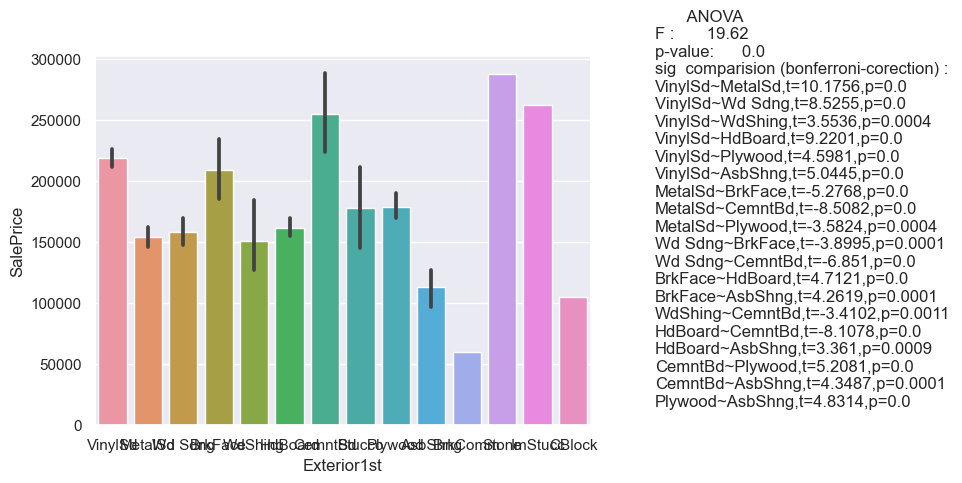

rVinylSd n=425,'Other' n=1ttest n'est pas possible
rVinylSd n=425,'Stone' n=1ttest n'est pas possible
rVinylSd n=425,'CBlock' n=1ttest n'est pas possible
rMetalSd n=180,'Other' n=1ttest n'est pas possible
rMetalSd n=180,'Stone' n=1ttest n'est pas possible
rMetalSd n=180,'CBlock' n=1ttest n'est pas possible
rWd Shng n=27,'Other' n=1ttest n'est pas possible
rWd Shng n=27,'Stone' n=1ttest n'est pas possible
rWd Shng n=27,'CBlock' n=1ttest n'est pas possible
rPlywood n=113,'Other' n=1ttest n'est pas possible
rPlywood n=113,'Stone' n=1ttest n'est pas possible
rPlywood n=113,'CBlock' n=1ttest n'est pas possible
rWd Sdng n=156,'Other' n=1ttest n'est pas possible
rWd Sdng n=156,'Stone' n=1ttest n'est pas possible
rWd Sdng n=156,'CBlock' n=1ttest n'est pas possible
rCmentBd n=48,'Other' n=1ttest n'est pas possible
rCmentBd n=48,'Stone' n=1ttest n'est pas possible
rCmentBd n=48,'CBlock' n=1ttest n'est pas possible
rBrkFace n=22,'Other' n=1ttest n'est pas possible
rBrkFace n=22,'Stone' n=1ttest n

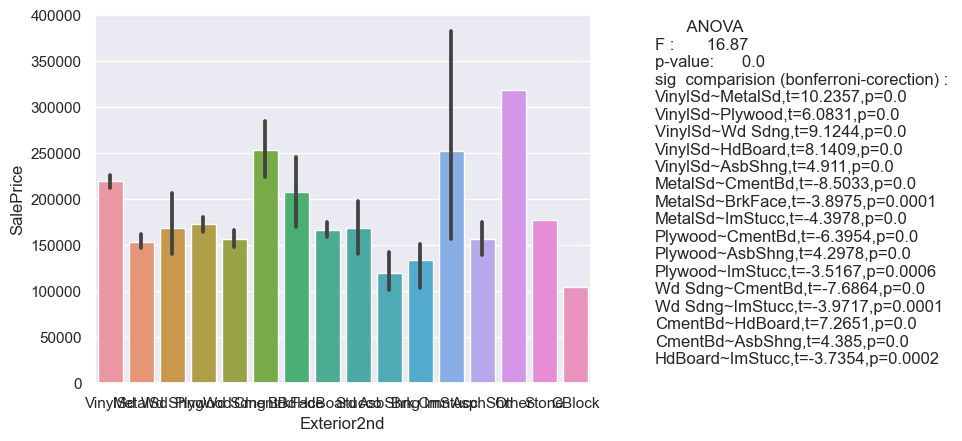

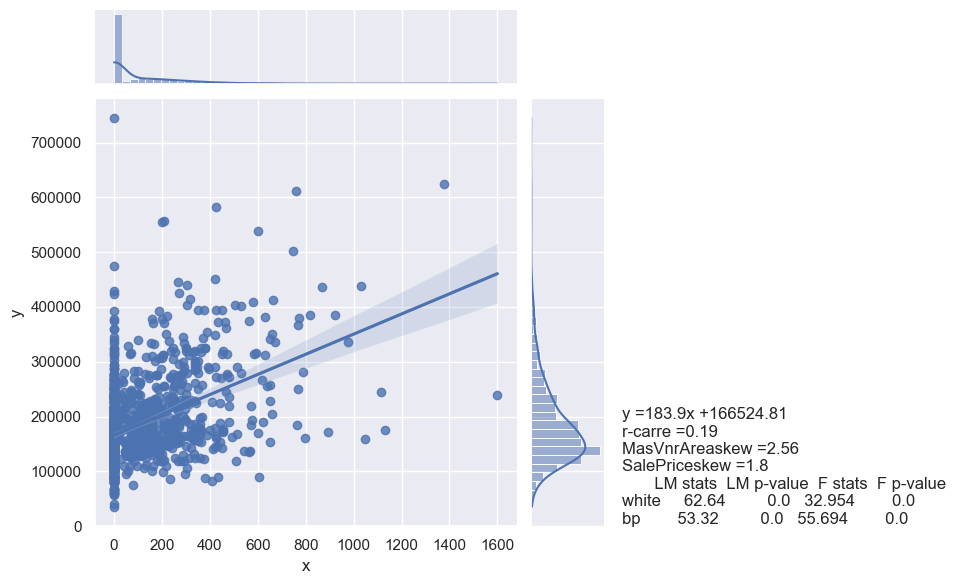

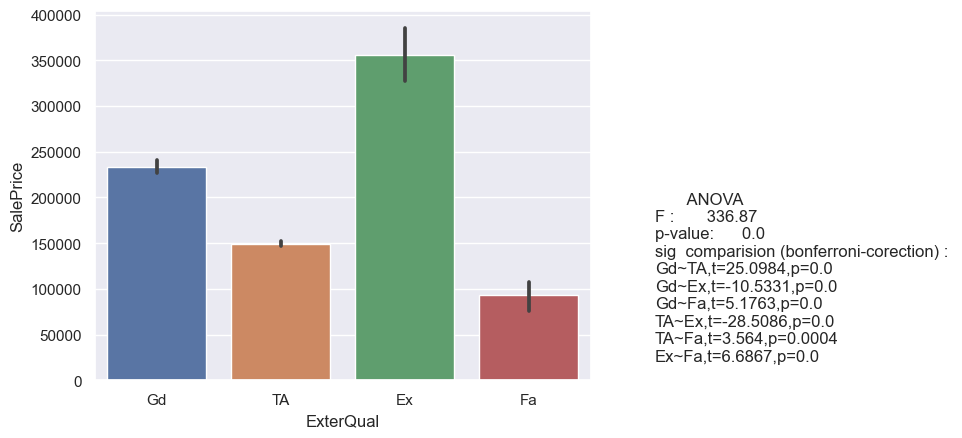

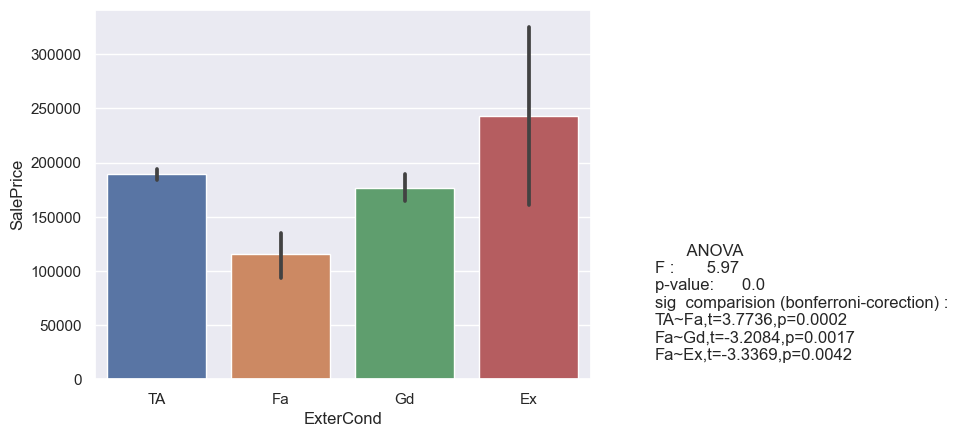

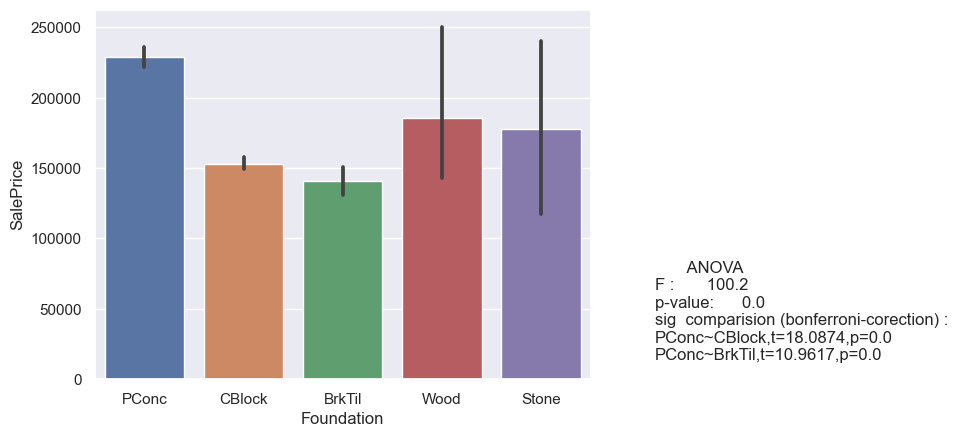

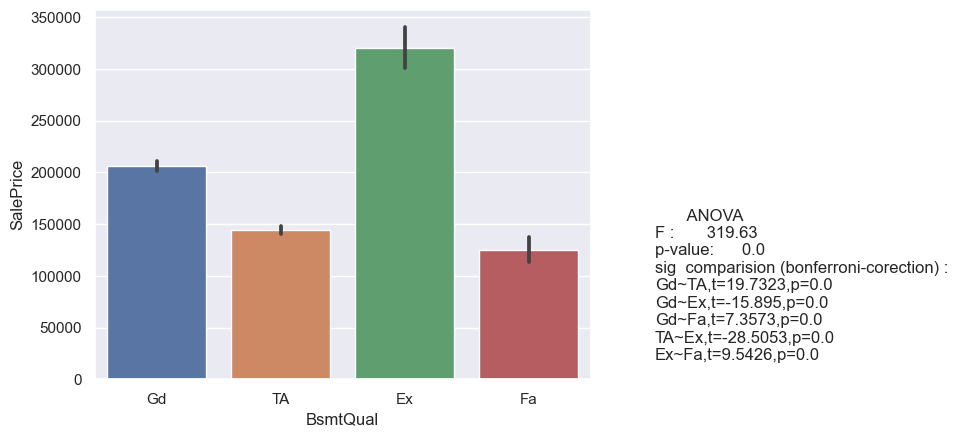

rTA n=1110,'Po' n=1ttest n'est pas possible
rGd n=58,'Po' n=1ttest n'est pas possible
rFa n=37,'Po' n=1ttest n'est pas possible


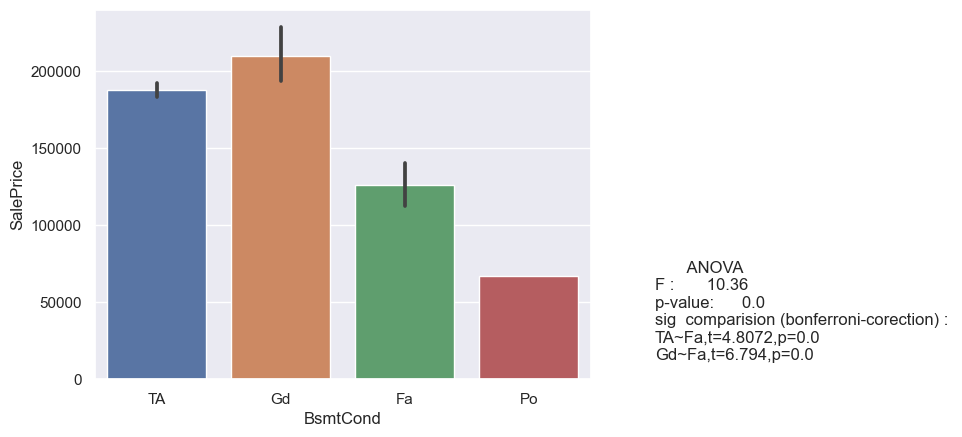

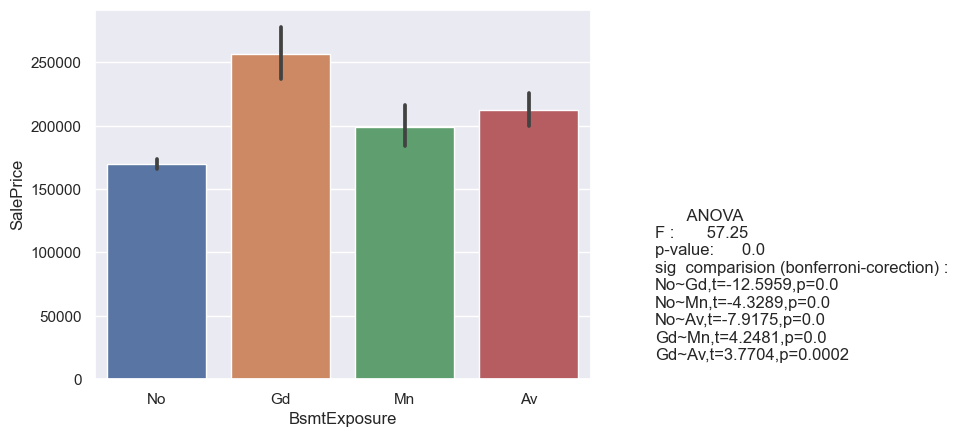

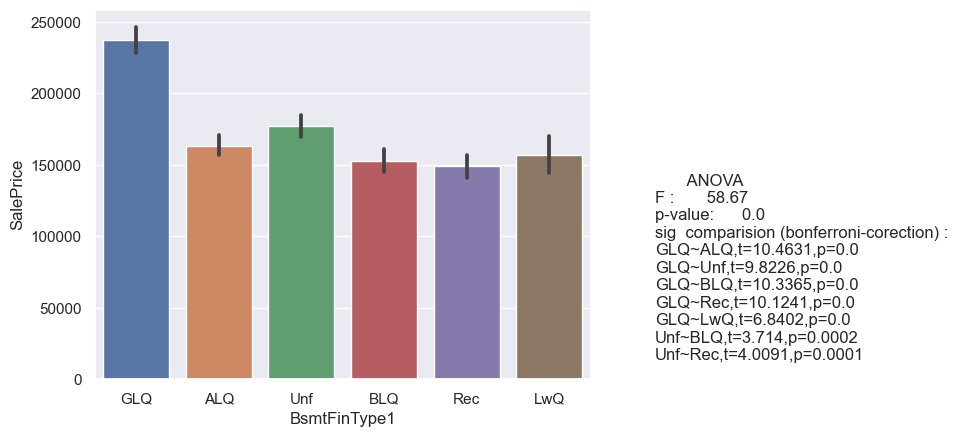

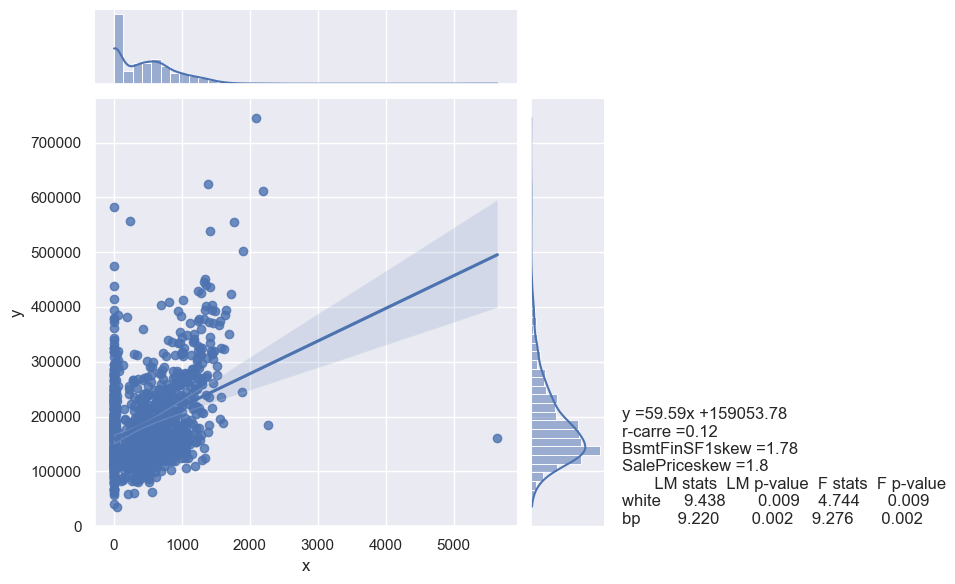

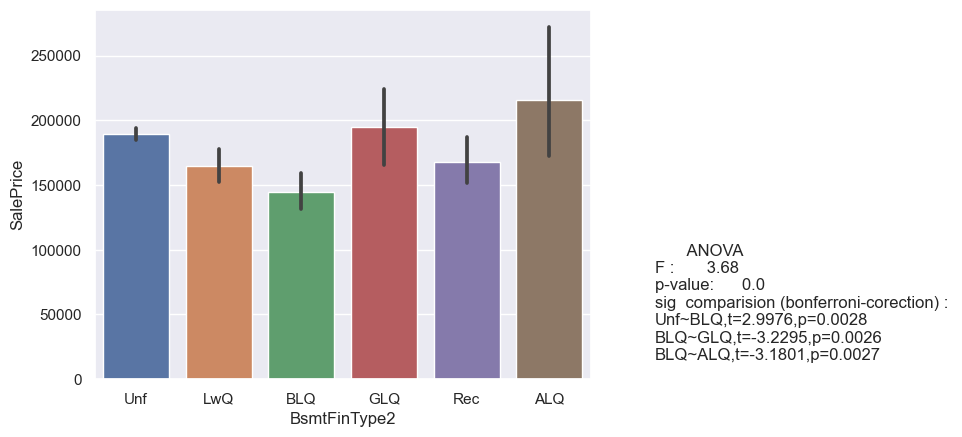

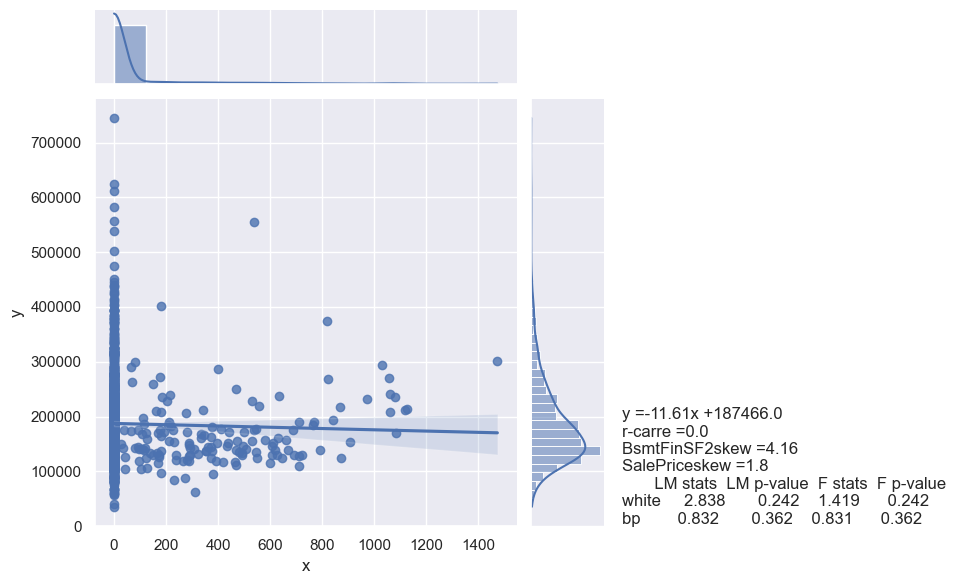

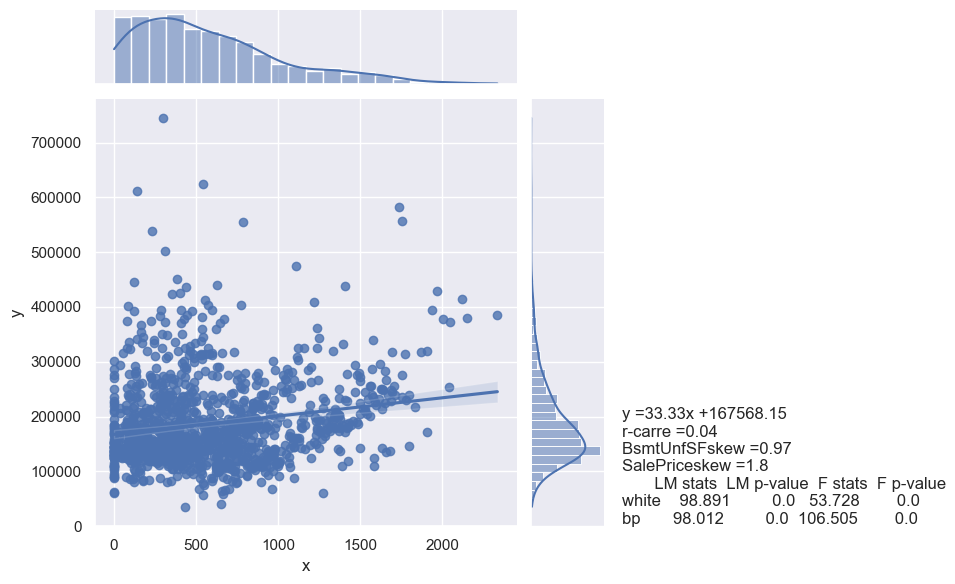

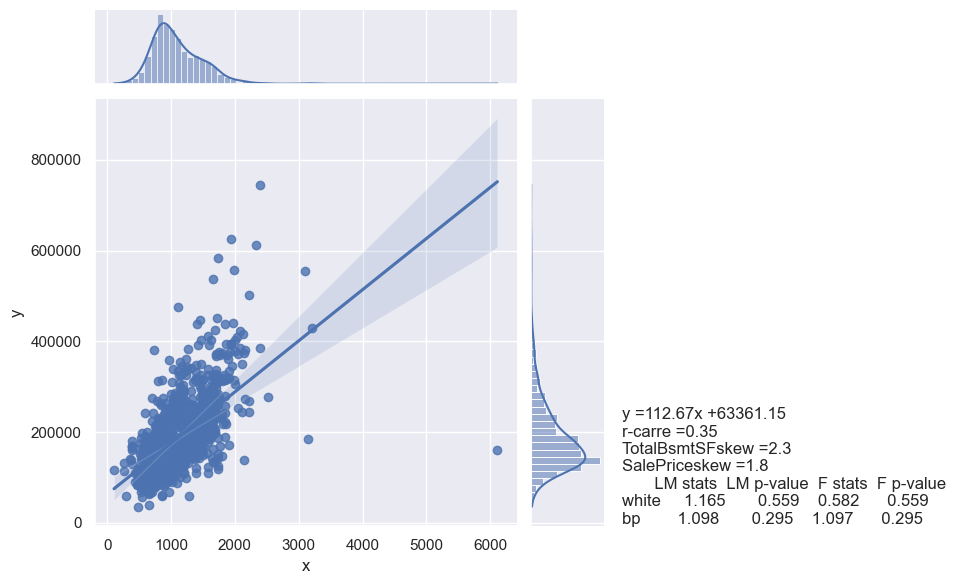

rGasA n=1187,'OthW' n=1ttest n'est pas possible
rGasW n=15,'OthW' n=1ttest n'est pas possible
rGrav n=3,'OthW' n=1ttest n'est pas possible


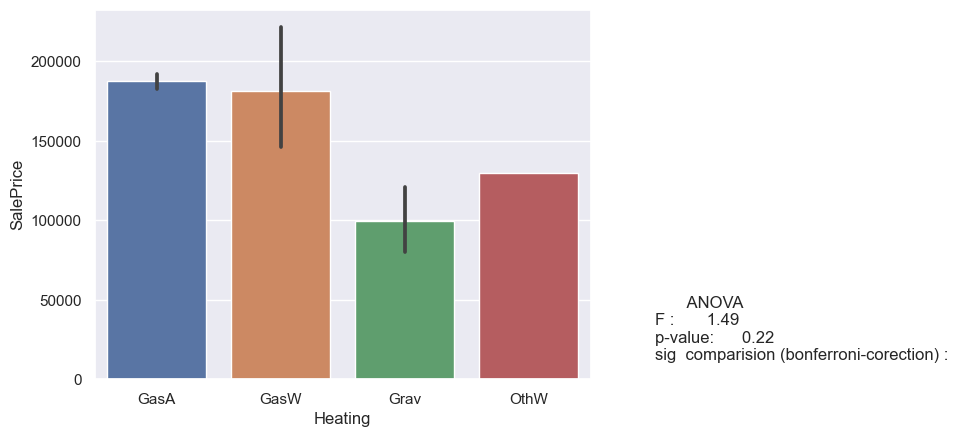

rEx n=627,'Po' n=1ttest n'est pas possible
rGd n=201,'Po' n=1ttest n'est pas possible
rTA n=344,'Po' n=1ttest n'est pas possible
rFa n=33,'Po' n=1ttest n'est pas possible


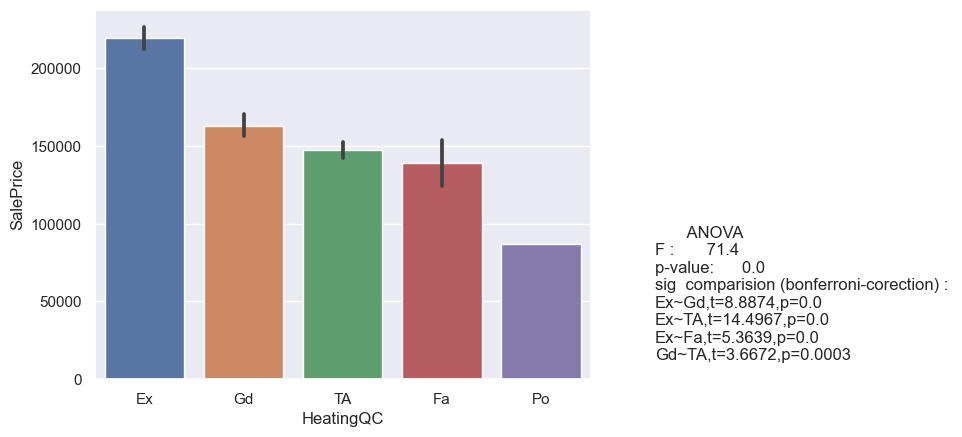

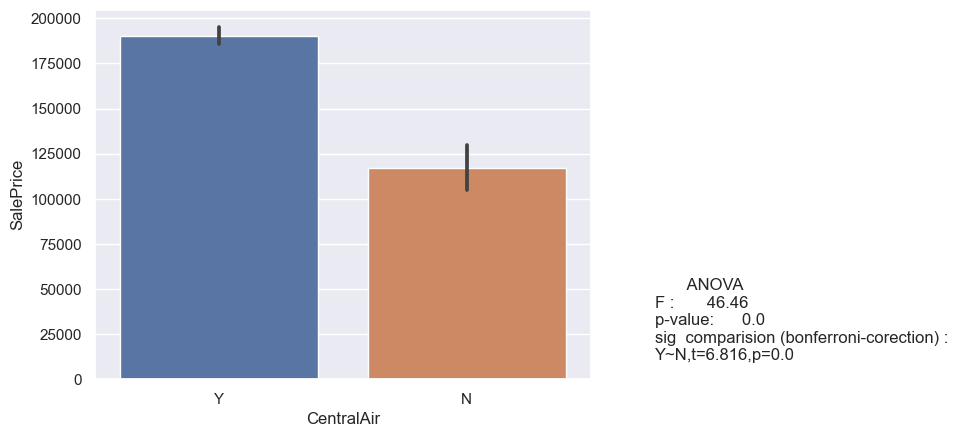

rSBrkr n=1118,'FuseP' n=1ttest n'est pas possible
rSBrkr n=1118,'Mix' n=1ttest n'est pas possible
rFuseF n=16,'FuseP' n=1ttest n'est pas possible
rFuseF n=16,'Mix' n=1ttest n'est pas possible
rFuseA n=70,'FuseP' n=1ttest n'est pas possible
rFuseA n=70,'Mix' n=1ttest n'est pas possible
rFuseP n=1,'Mix' n=1ttest n'est pas possible


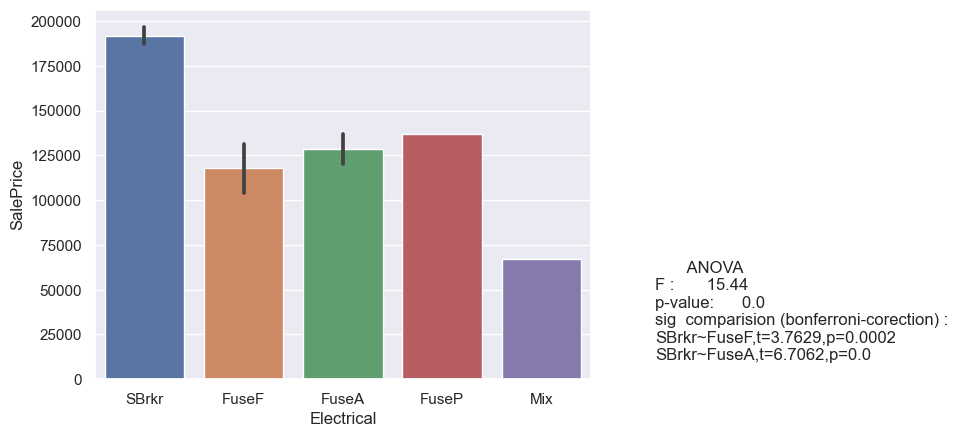

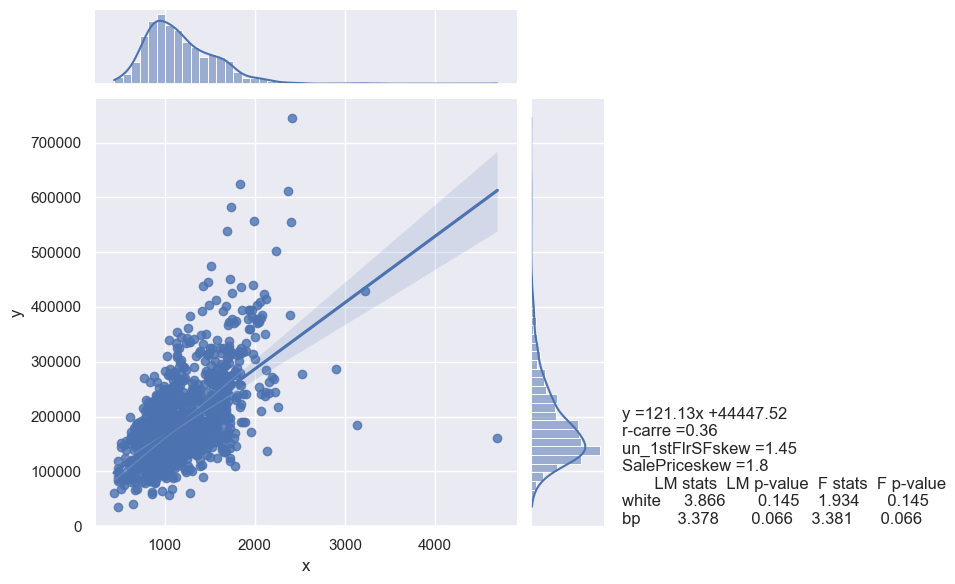

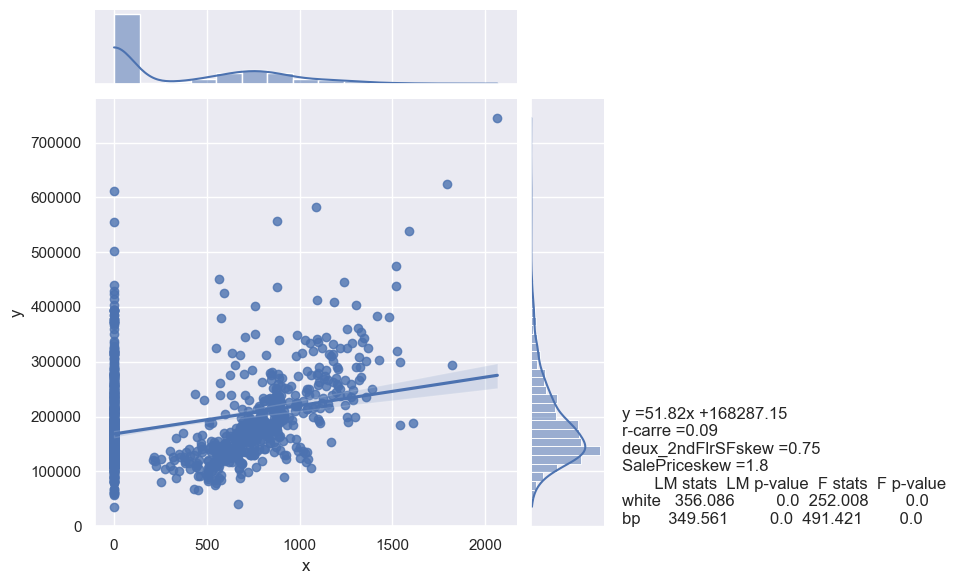

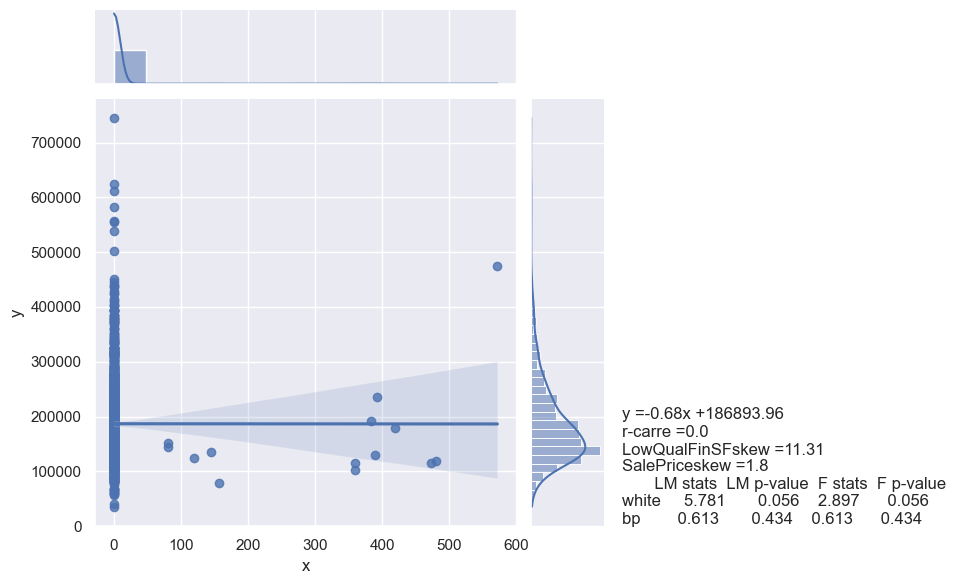

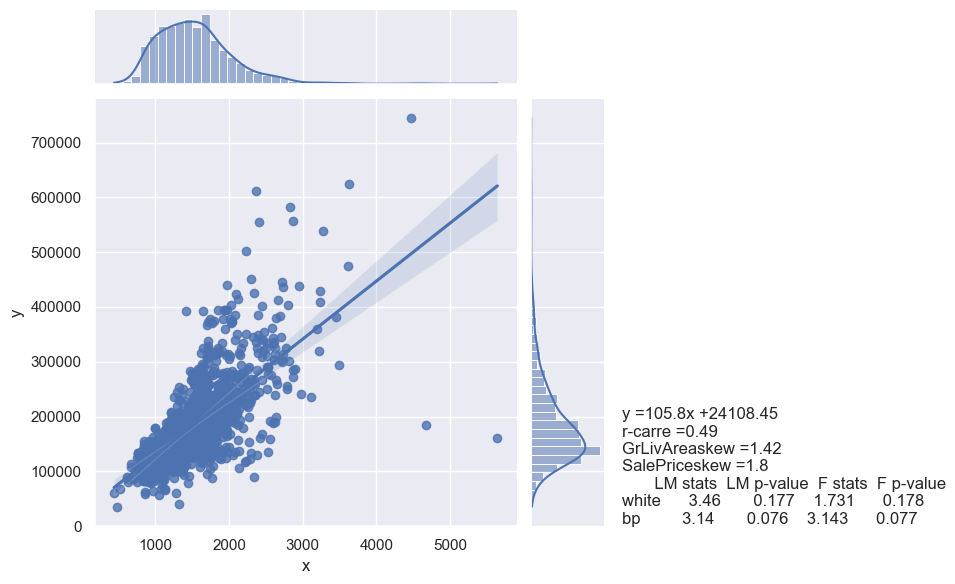

...

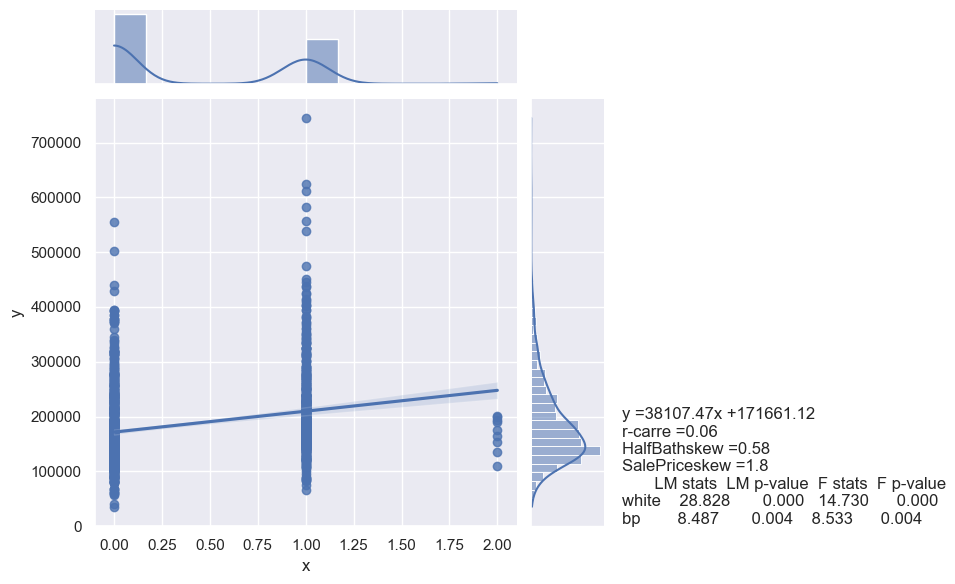

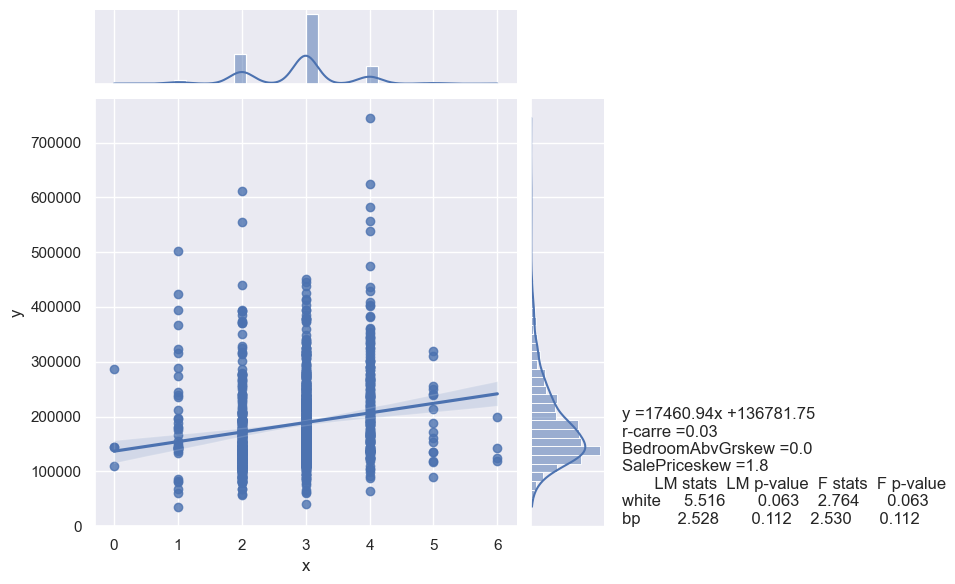

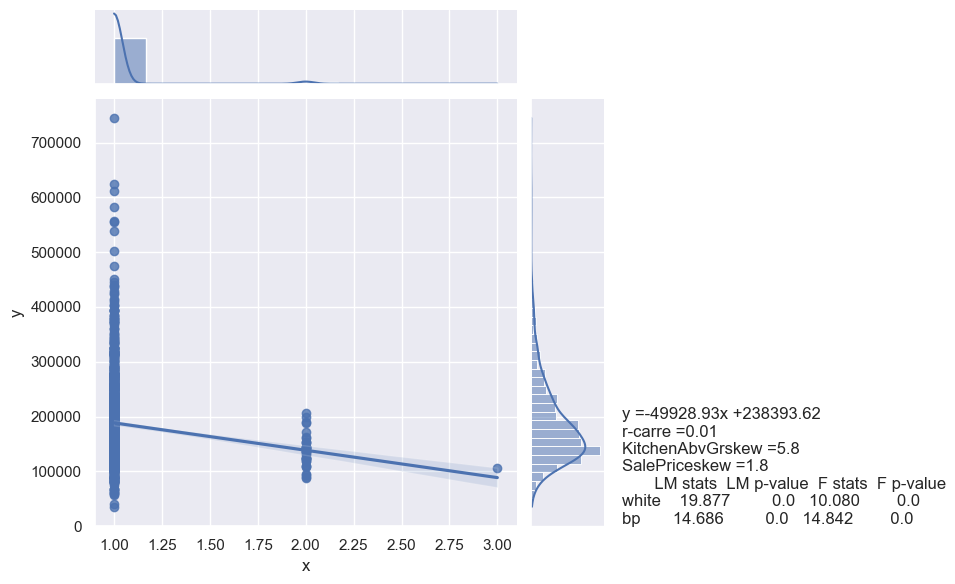

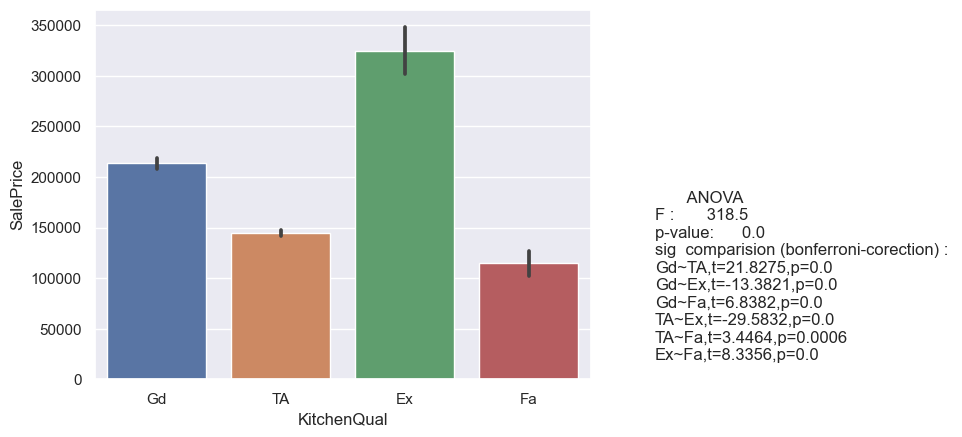

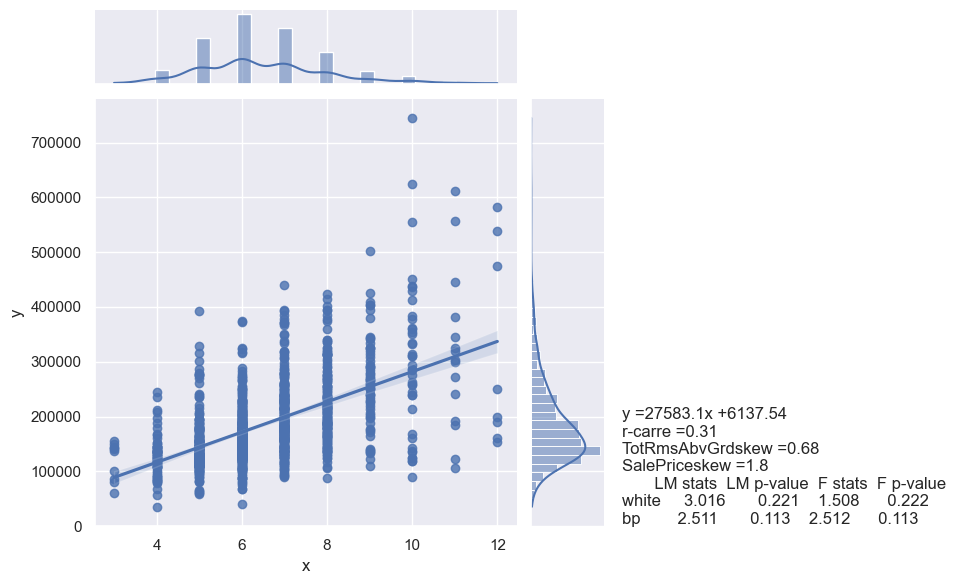

rTyp n=1131,'Sev' n=1ttest n'est pas possible
rMin1 n=26,'Sev' n=1ttest n'est pas possible
rMaj1 n=8,'Sev' n=1ttest n'est pas possible
rMin2 n=26,'Sev' n=1ttest n'est pas possible
rMod n=11,'Sev' n=1ttest n'est pas possible
rMaj2 n=3,'Sev' n=1ttest n'est pas possible


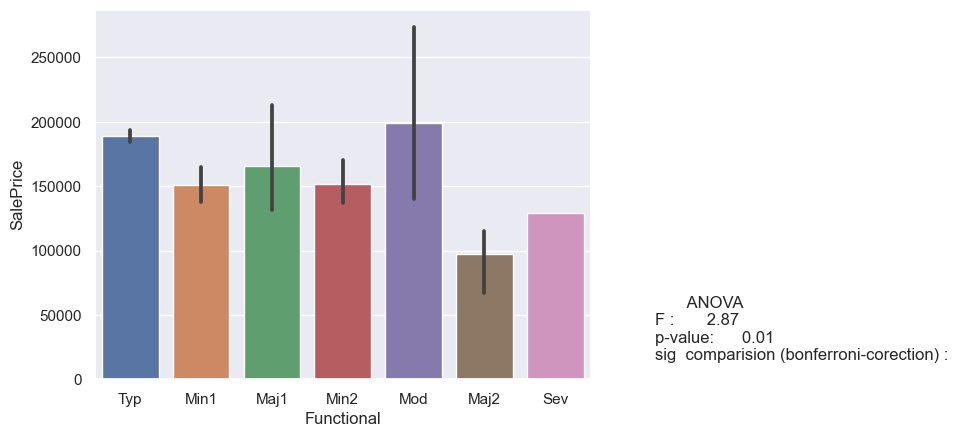

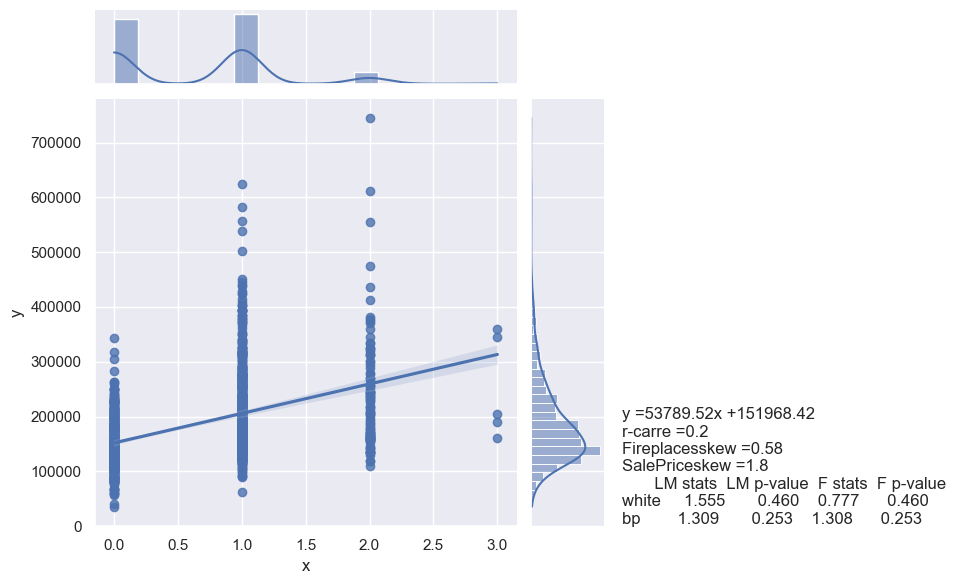

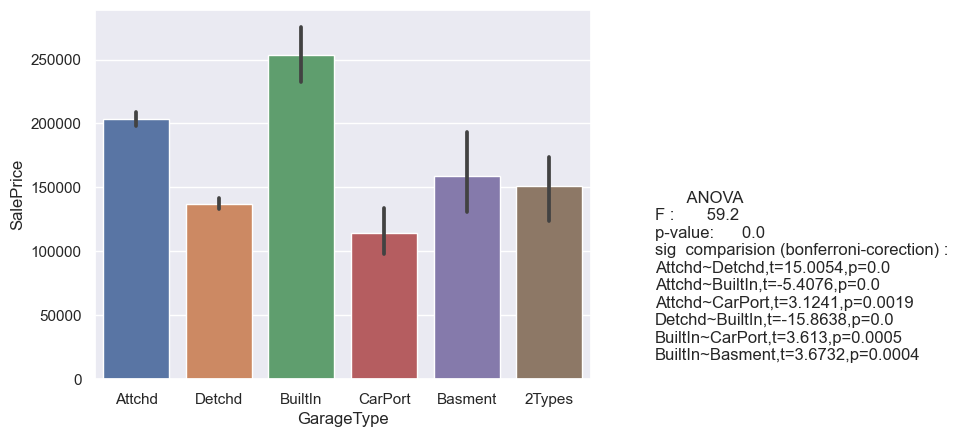

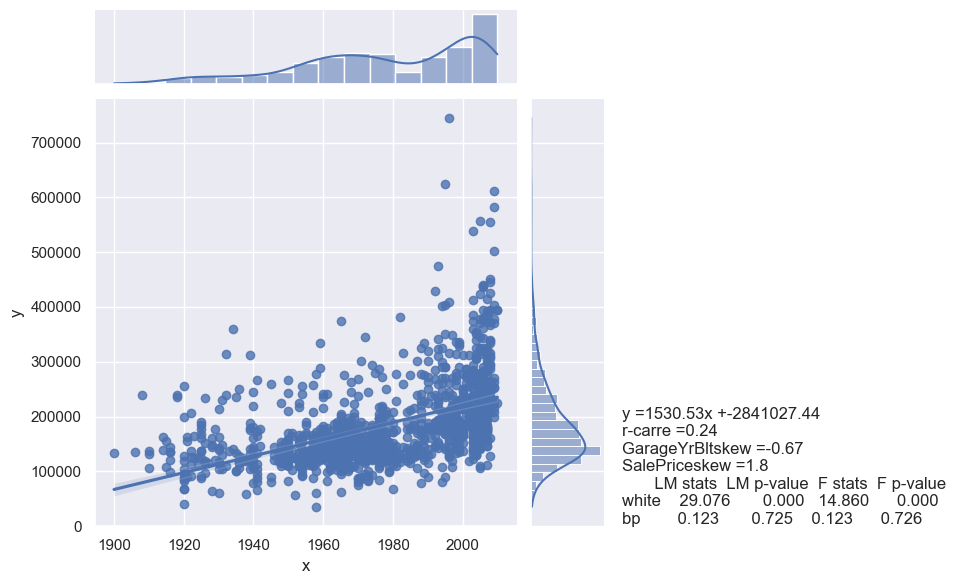

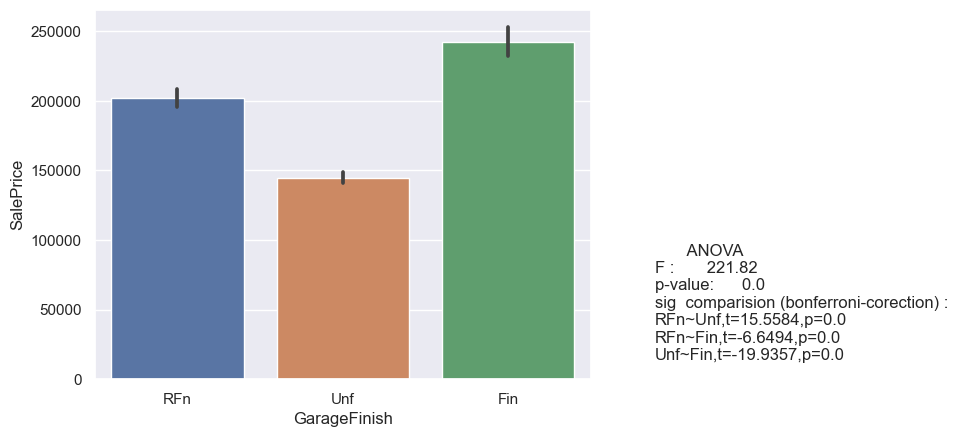

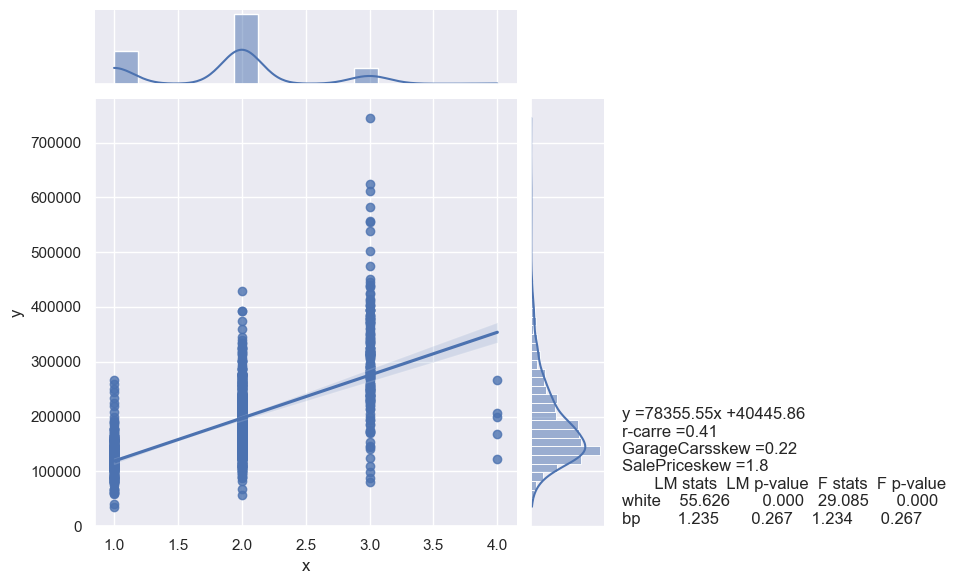

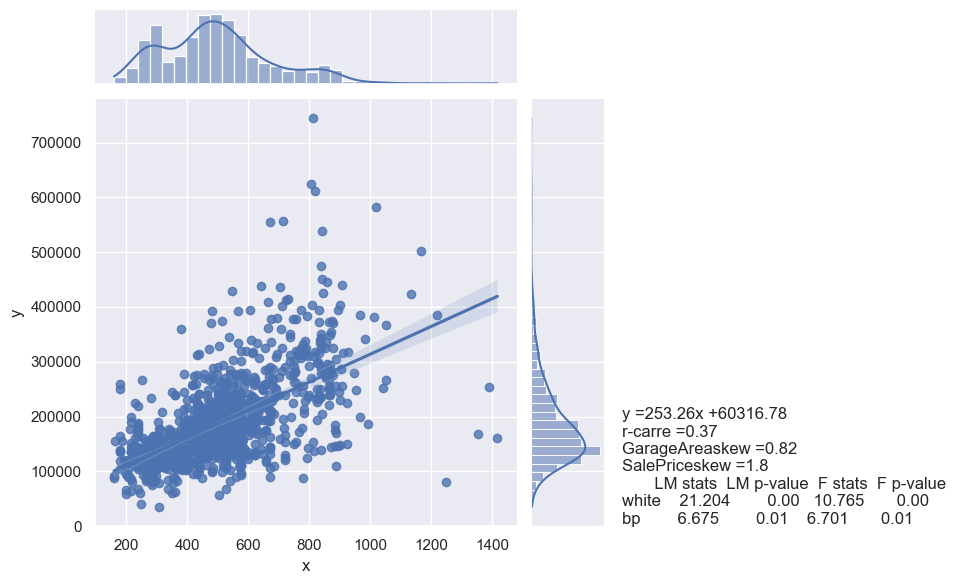

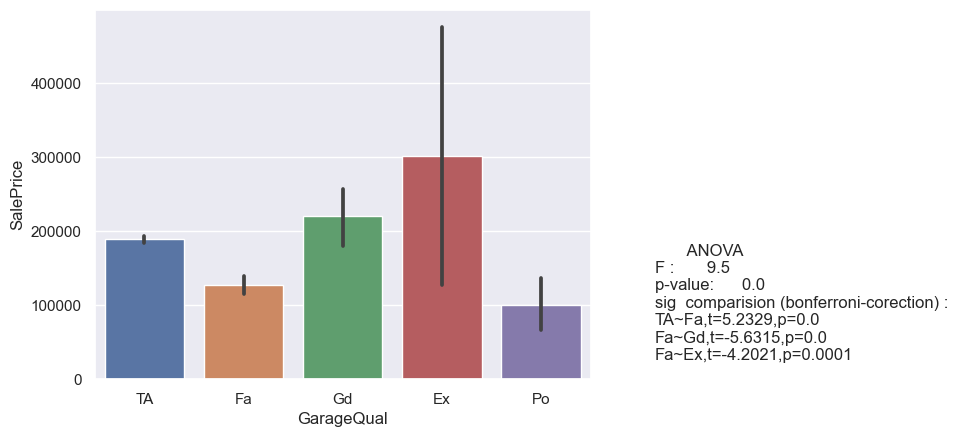

rTA n=1162,'Ex' n=1ttest n'est pas possible
rFa n=29,'Ex' n=1ttest n'est pas possible
rGd n=8,'Ex' n=1ttest n'est pas possible
rPo n=6,'Ex' n=1ttest n'est pas possible


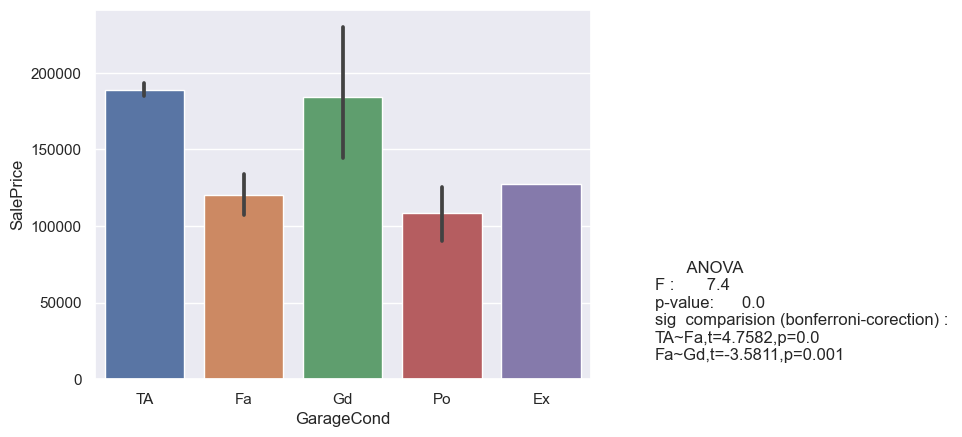

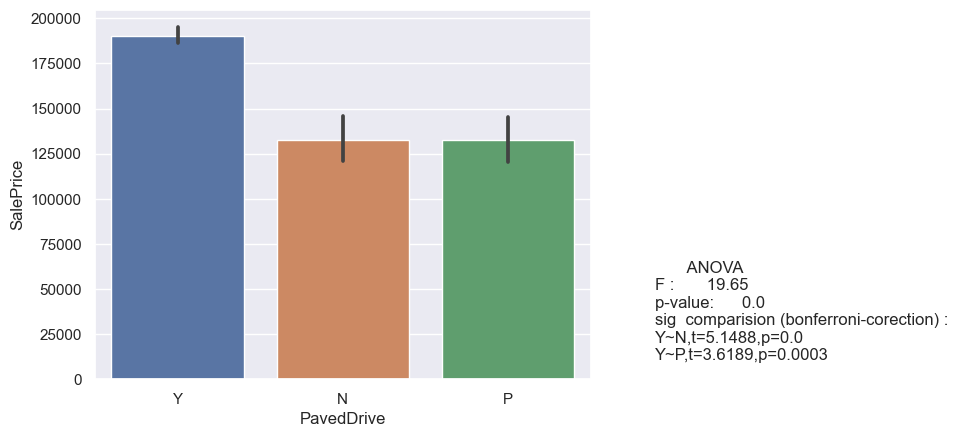

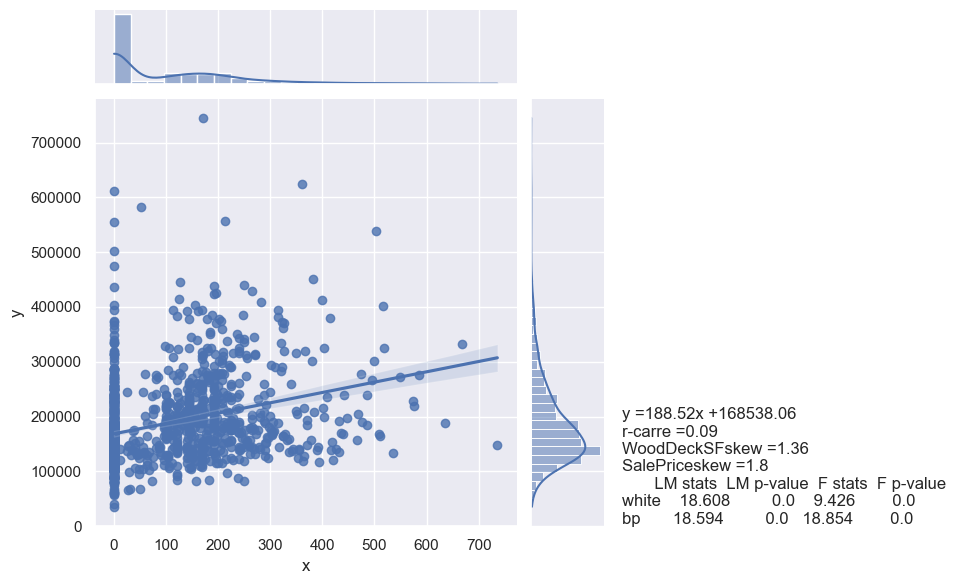

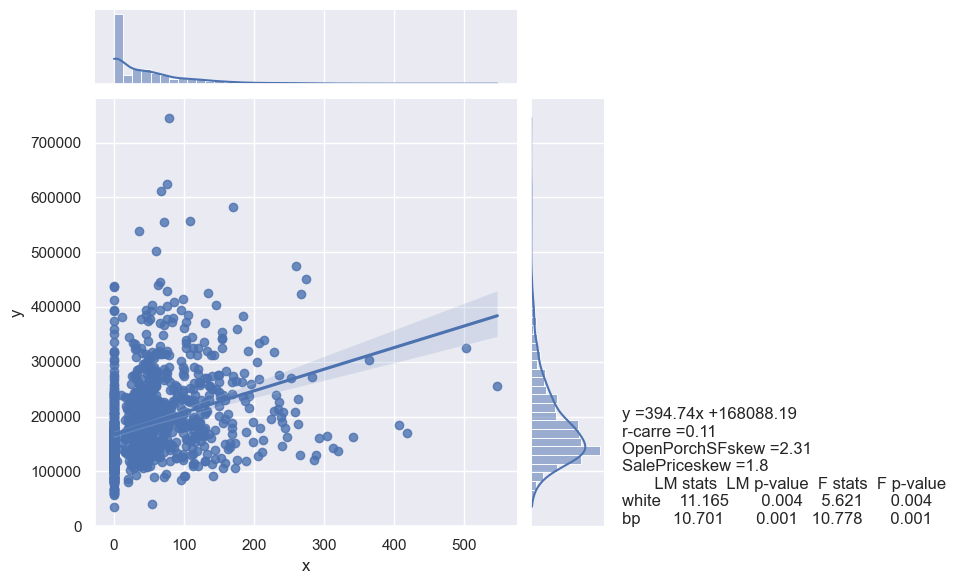

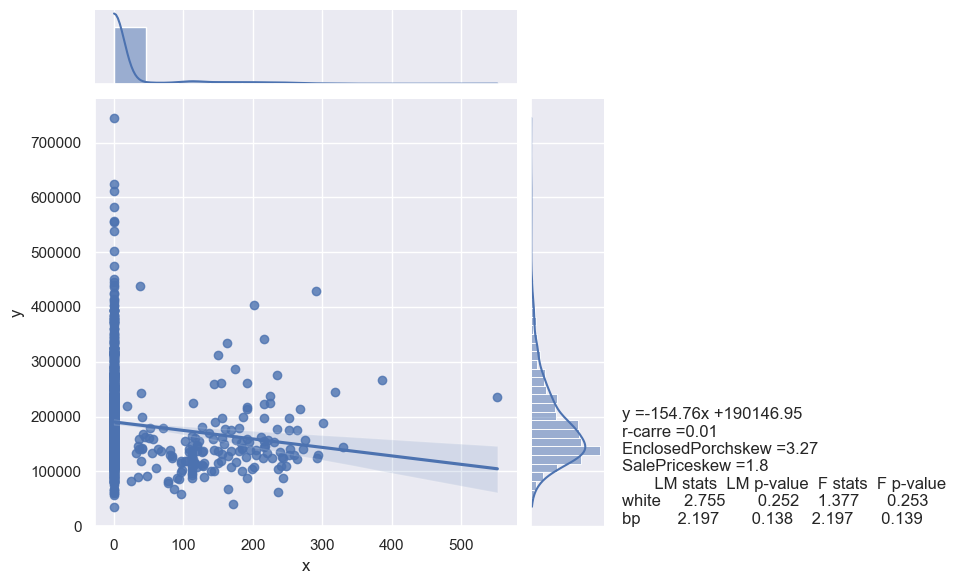

...

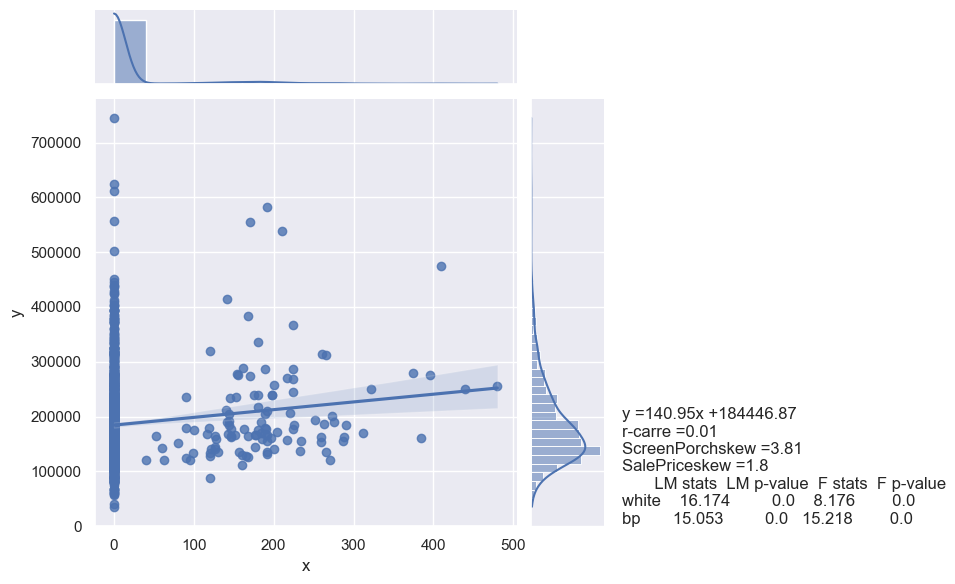

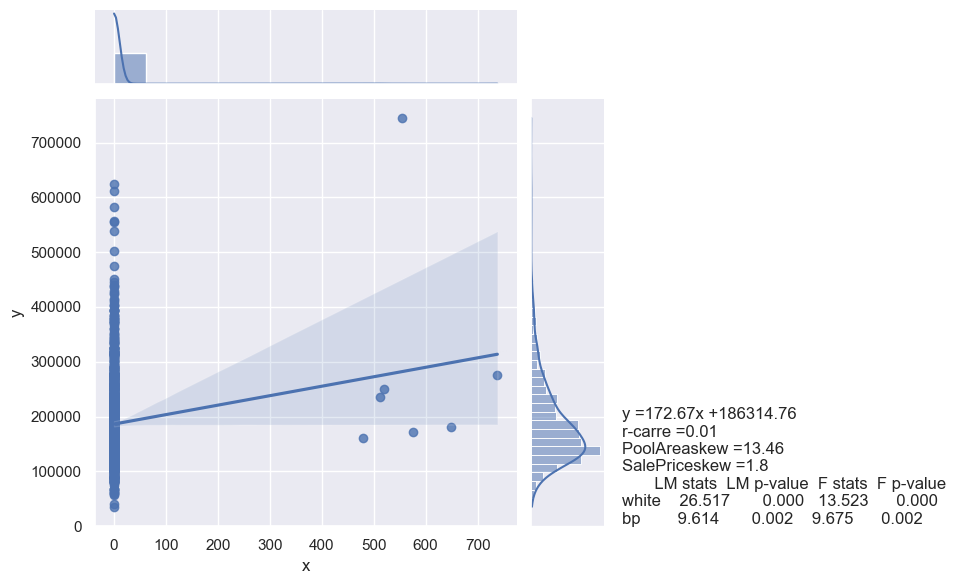

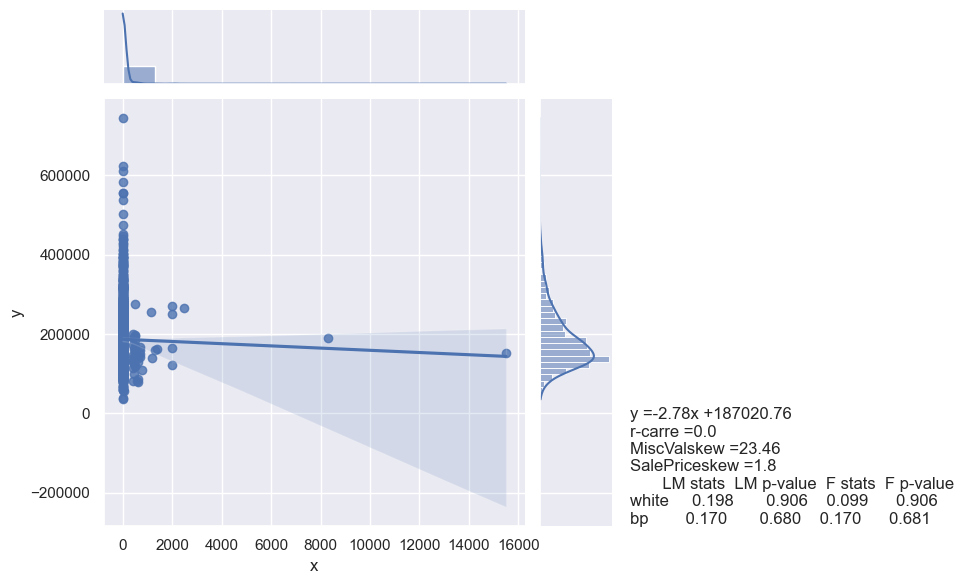

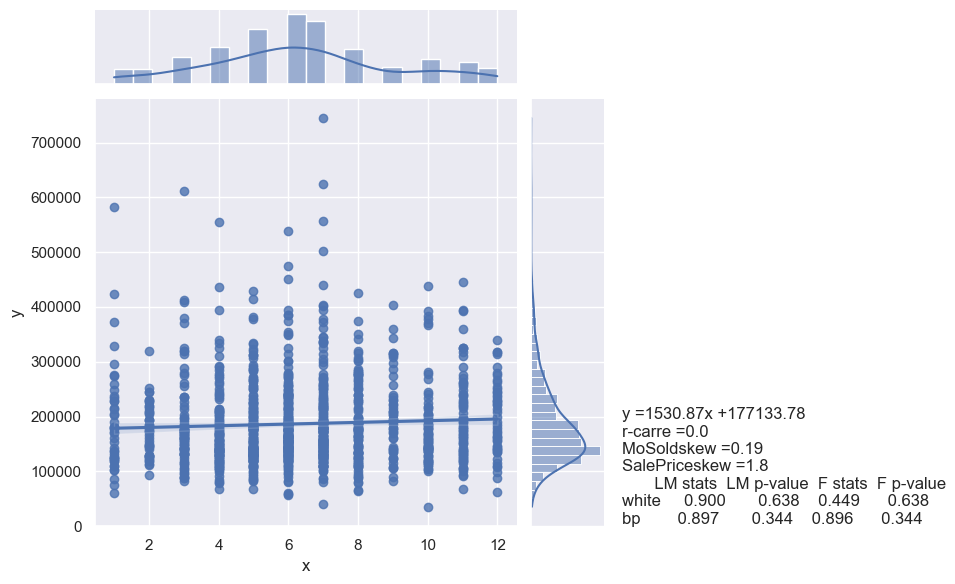

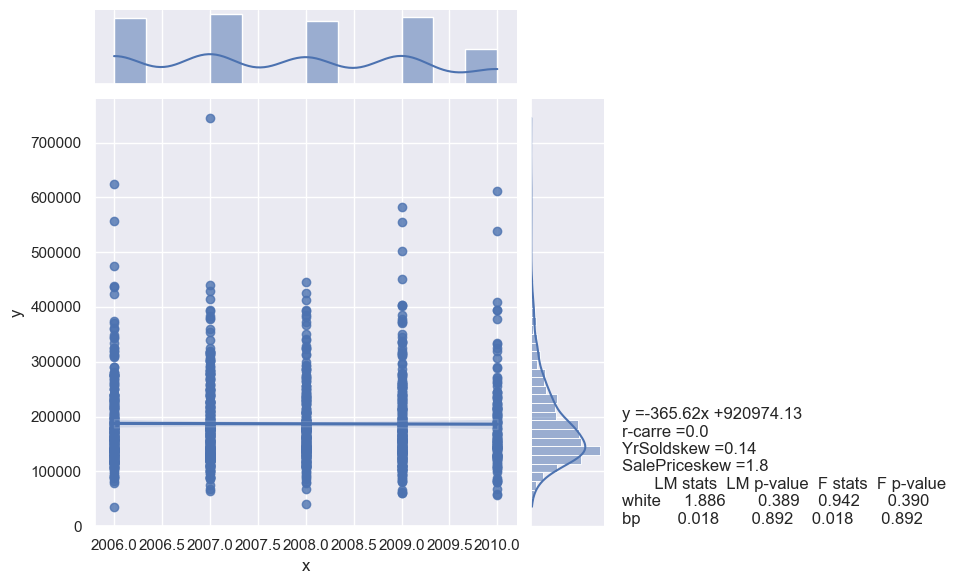

rWD n=1039,'Oth' n=1ttest n'est pas possible
rNew n=108,'Oth' n=1ttest n'est pas possible
rCOD n=38,'Oth' n=1ttest n'est pas possible
rConLI n=4,'Oth' n=1ttest n'est pas possible
rCWD n=4,'Oth' n=1ttest n'est pas possible
rConLw n=4,'Oth' n=1ttest n'est pas possible
rCon n=2,'Oth' n=1ttest n'est pas possible
rConLD n=6,'Oth' n=1ttest n'est pas possible


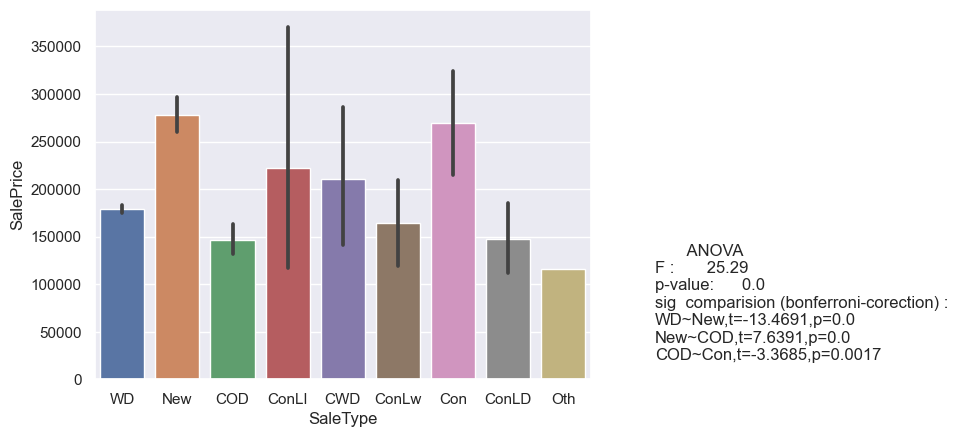

rNormal n=991,'AdjLand' n=1ttest n'est pas possible
rAbnorml n=79,'AdjLand' n=1ttest n'est pas possible
rPartial n=111,'AdjLand' n=1ttest n'est pas possible
rFamily n=17,'AdjLand' n=1ttest n'est pas possible
rAlloca n=7,'AdjLand' n=1ttest n'est pas possible


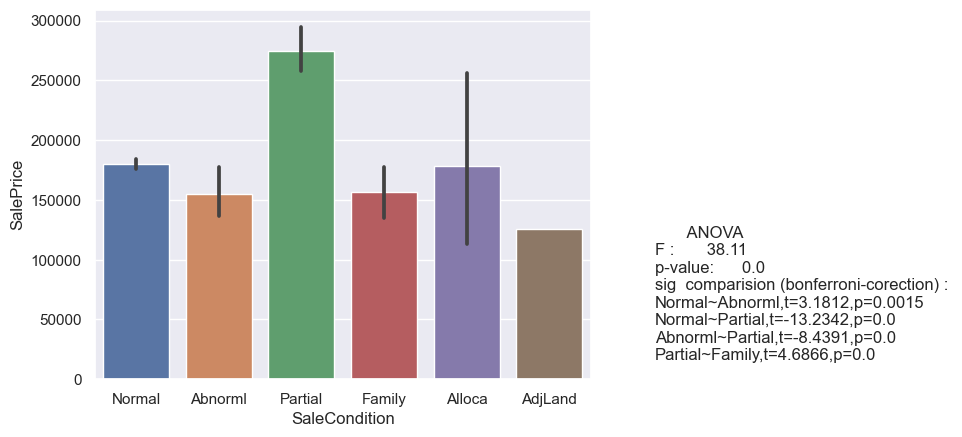

,stats,+/-,effect_size,p_value
OverallQual,r,1.0,0.788,0.000
GrLivArea,r,1.0,0.701,0.000
GarageCars,r,1.0,0.643,0.000
GarageArea,r,1.0,0.609,0.000
un_1stFlrSF,r,1.0,0.602,0.000
TotalBsmtSF,r,1.0,0.593,0.000
FullBath,r,1.0,0.573,0.000
TotRmsAbvGrd,r,1.0,0.558,0.000
YearRemodAdd,r,1.0,0.515,0.000
YearBuilt,r,1.0,0.505,0.000


In [93]:
def bivstats(data,label):
    from scipy import stats
    import pandas as np
    import numpy as np

    output_df=pd.DataFrame(columns=['stats','+/-','effect_size','p_value'])
    for col in df:
         if not col==label :
            if pd.api.types.is_numeric_dtype(df[col]):
                r,p=stats.pearsonr(df[label],df[col])
                output_df.loc[col]=["r",np.sign(r),abs(round(r,3)),round(p,3)]
                scatter(df[col],df[label])
            else:
                F,p=anova(df,col,label)
                output_df.loc[col]=["F","",round(F,3),round(p,3)]
                barchar(df,col,label)
        
            
    return output_df.sort_values(by=["stats","effect_size"],ascending=[False,False])
bivstats(df,'SalePrice')

multivarieble 

In [104]:
#preparing the dataframe 
# turn the categorical variable to a numeric once by the dummmy code


from sklearn import preprocessing

def mlr_prepare(df):
    for col in df:
        if not pd.api.types.is_numeric_dtype(df[col]):
            df = df.join(pd.get_dummies(df[col], prefix=col, drop_first=False))
    df_numeric = df.select_dtypes(np.number)
    df_minmax = pd.DataFrame(preprocessing.MinMaxScaler().fit_transform(df_numeric), columns=df_numeric.columns)
    return df_minmax


df = mlr_prepare(df)
df.head()

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,un_1stFlrSF,deux_2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,trois_3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,0.235294,0.033420,0.625,0.428571,0.946154,0.883333,0.12250,0.125089,0.0,0.064212,0.125062,0.098260,0.413559,0.0,0.244427,0.5,0.0,0.666667,0.5,0.500000,0.0,0.555556,0.000000,0.936364,0.333333,0.308426,0.000000,0.111517,0.000000,0.0,0.0,0.0,0.0,0.090909,0.50,0.244035
1,0.000000,0.038795,0.500,0.857143,0.738462,0.433333,0.00000,0.173281,0.0,0.121575,0.192673,0.193700,0.000000,0.0,0.158340,0.0,0.5,0.666667,0.0,0.500000,0.0,0.333333,0.333333,0.690909,0.333333,0.238474,0.404891,0.000000,0.000000,0.0,0.0,0.0,0.0,0.363636,0.25,0.205990
2,0.235294,0.046507,0.625,0.428571,0.930769,0.866667,0.10125,0.086109,0.0,0.185788,0.135720,0.113305,0.419370,0.0,0.259032,0.5,0.0,0.666667,0.5,0.500000,0.0,0.333333,0.333333,0.918182,0.333333,0.356121,0.000000,0.076782,0.000000,0.0,0.0,0.0,0.0,0.727273,0.50,0.265171
3,0.294118,0.038561,0.625,0.428571,0.269231,0.333333,0.00000,0.038271,0.0,0.231164,0.108410,0.122943,0.366102,0.0,0.245772,0.5,0.0,0.333333,0.0,0.500000,0.0,0.444444,0.333333,0.890909,0.666667,0.383148,0.000000,0.063985,0.492754,0.0,0.0,0.0,0.0,0.090909,0.00,0.147514
4,0.235294,0.060576,0.750,0.428571,0.923077,0.833333,0.21875,0.116052,0.0,0.209760,0.173189,0.166197,0.509927,0.0,0.338201,0.5,0.0,0.666667,0.5,0.666667,0.0,0.666667,0.333333,0.909091,0.666667,0.537361,0.260870,0.153565,0.000000,0.0,0.0,0.0,0.0,1.000000,0.50,0.302511


In [98]:
def mlr(df, label):
    y = df[label]
    x = df.drop(columns=[label]).assign(const=1)  
    model = sm.OLS(y, x).fit()
    return model
results=mlr(df,'SalePrice')
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.807
Model:                            OLS   Adj. R-squared:                  0.801
Method:                 Least Squares   F-statistic:                     148.0
Date:                Sun, 17 Sep 2023   Prob (F-statistic):               0.00
Time:                        14:27:32   Log-Likelihood:                 1945.9
No. Observations:                1206   AIC:                            -3824.
Df Residuals:                    1172   BIC:                            -3651.
Df Model:                          33                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
MSSubClass         -0.0396      0.007     -5.472      0.000      -0.054      -0.025
LotArea             0.1331      0.034      3.881      0.000       0.066       0.200
OverallQual         0.2198      0.015     14.595      0.000       0.190       0.249
OverallCond         0.0476      0.012      3.958      0.000       0.024       0.071
YearBuilt           0.0620      0.015      4.037      0.000       0.032       0.092
YearRemodAdd        0.0147      0.007      2.166      0.031       0.001       0.028
MasVnrArea          0.0465      0.014      3.237      0.001       0.018       0.075
BsmtFinSF1          0.0773      0.026      2.997      0.003       0.027       0.128
BsmtFinSF2          0.0002      0.014      0.012      0.991      -0.027       0.027
BsmtUnfSF          -0.0010      0.012     -0.083      0.934      -0.025       0.023
TotalBsmtSF         0.0739      0.028      2.608      0.009       0.018       0.129
un_1stFlrSF         0.1247      0.027      4.562      0.000       0.071       0.178
deux_2ndFlrSF       0.0623      0.013      4.780      0.000       0.037       0.088
LowQualFinSF        0.0167      0.022      0.756      0.450      -0.027       0.060
GrLivArea           0.1285      0.022      5.862      0.000       0.085       0.171
BsmtFullBath        0.0262      0.008      3.186      0.001       0.010       0.042
BsmtHalfBath       -0.0043      0.012     -0.351      0.726      -0.028       0.020
FullBath            0.0096      0.013      0.714      0.475      -0.017       0.036
HalfBath           -0.0071      0.008     -0.849      0.396      -0.024       0.009
BedroomAbvGr       -0.0764      0.016     -4.633      0.000      -0.109      -0.044
KitchenAbvGr       -0.0741      0.019     -3.853      0.000      -0.112      -0.036
TotRmsAbvGrd        0.0930      0.017      5.383      0.000       0.059       0.127
Fireplaces          0.0174      0.008      2.129      0.033       0.001       0.033
GarageYrBlt        -0.0092      0.013     -0.696      0.487      -0.035       0.017
GarageCars          0.0645      0.014      4.752      0.000       0.038       0.091
GarageArea          0.0035      0.019      0.178      0.858      -0.035       0.041
WoodDeckSF          0.0273      0.009      3.003      0.003       0.009       0.045
OpenPorchSF        -0.0094      0.013     -0.716      0.474      -0.035       0.016
EnclosedPorch       0.0115      0.015      0.785      0.433      -0.017       0.040
trois_3SsnPorch     0.0194      0.023      0.852      0.394      -0.025       0.064
ScreenPorch         0.0420      0.012      3.499      0.000       0.018       0.066
PoolArea           -0.0289      0.025     -1.166      0.244      -0.078       0.020
MiscVal            -0.0140      0.041     -0.338      0.736      -0.095       0.067
MoSold              0.0037      0.006      0.626      0.532

In [99]:
def mlr_feature_df(results):
    df_feature=pd.DataFrame({'coef':results.params,'t':abs(results.tvalues),'p':results.pvalues})
    df_feature.drop(labels=['const'],inplace=True)
    df_feature=df_feature.sort_values(by=['t','p'])
    return df_feature
mlr_feature_df(results)

,coef,t,p
BsmtFinSF2,0.000164,0.011769,9.906119e-01
BsmtUnfSF,-0.001028,0.083374,9.335686e-01
GarageArea,0.003456,0.178368,8.584645e-01
MiscVal,-0.013985,0.337620,7.357098e-01
BsmtHalfBath,-0.004326,0.351166,7.255268e-01
MoSold,0.003707,0.625822,5.315539e-01
GarageYrBlt,-0.009191,0.695732,4.867345e-01
FullBath,0.009640,0.714182,4.752566e-01
OpenPorchSF,-0.009444,0.716474,4.738414e-01
YrSold,-0.003198,0.732055,4.642815e-01


In [100]:
def mlr_fit(results,actual,roundto=10):
    df_features=mlr_feature_df(results)
    residuals=np.array(actual)-np.array(results.fittedvalues)
    rmse=np.sqrt(sum(residuals**2)/len(actual))
    mae=np.mean(abs(np.array(actual)-np.array(results.fittedvalues)))
    fit_stats=[round(results.rsquared,roundto),round(results.rsquared_adj,roundto),round(results.rsquared-results.rsquared_adj,roundto),round(rmse,roundto),
              round(mae,roundto),[df_features.index.values]]
    return fit_stats



In [102]:
def mlr_step(df,label,min=2):
    df_models=pd.DataFrame(columns=['R2','R2a','diff','RMSE','MAE','features'])
    df=mlr_prepare(df)
    results=mlr(df,label)
    df_models.loc[str(len(results.params))]=mlr_fit(results,df[label],10)
    df_features=mlr_feature_df(results)

    while len(results.params)>2 :
        df=df.drop(columns=[df_features.index[0]])
        results=mlr(df,label)
        df_features=mlr_feature_df(results)
        df_models.loc[len(results.params)]=mlr_fit(results,df[label],10)
    df_models.to_csv('C:\\.1STUDY_DOCS\\ESI\\IIN\\1 ere stage'+label+'.csv')
    df_models.drop(columns=['features'],inplace=True)
    return df_models
  
df_models=mlr_step(df,'SalePrice')
df_models

,R2,R2a,diff,RMSE,MAE
36,0.806521,0.801073,0.005448,0.048198,0.029655
35,0.806521,0.801073,0.005448,0.048198,0.029655
34,0.806520,0.801242,0.005278,0.048198,0.029654
33,0.806515,0.801406,0.005109,0.048199,0.029673
32,0.806496,0.801556,0.004941,0.048201,0.029674
31,0.806478,0.801705,0.004772,0.048203,0.029683
30,0.806415,0.801810,0.004605,0.048211,0.029688
29,0.806342,0.801903,0.004439,0.048220,0.029637
28,0.806342,0.801903,0.004439,0.048220,0.029637
27,0.806339,0.802069,0.004271,0.048220,0.029641


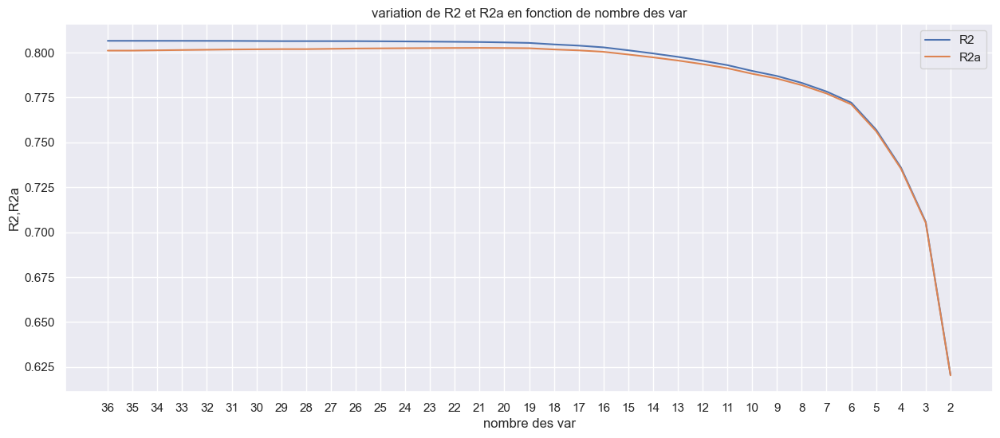

In [103]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df_models is your DataFrame
df_models.index = df_models.index.astype(str)

fig, ax = plt.subplots(figsize=(15, 6))

sns.lineplot(data=df_models, x=df_models.index, y=df_models.R2, ax=ax, label='R2')
sns.lineplot(data=df_models, x=df_models.index, y=df_models.R2a, ax=ax, label='R2a')

ax.set_ylim()
ax.set_xlabel('nombre des var')  
ax.set_ylabel('R2,R2a')  
ax.set_title('variation de R2 et R2a en fonction de nombre des var')      

plt.legend()
plt.show()
